# Implémentez un modèle de scoring

## Librairies

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
import pickle

pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)

## Formules importées

In [2]:
def tauxDf(df) :
    dftaux = df.notna().sum().to_frame().transpose() / len(df)
    return dftaux

def bpDfTaux(df) :
    plt.figure(figsize=(30,3))
    sns.barplot(data=tauxDf(df))
    plt.xticks(rotation=90)
    plt.title("Taux de remplissage du DataFrame")

def suppression_colonnes_trop_vides(df, seuil=0.4):
    n_rows = len(df)
    empty_columns = df.columns[df.isna().sum() >= n_rows * seuil]
    return df.drop(empty_columns, axis=1)

def convert_int64_to_int8(df):
    for col in df.select_dtypes(include='int64'):
        if df[col].min() >= -128 and df[col].max() <= 127:
            df[col] = df[col].astype(np.int8)
        elif df[col].min() >= 0 and df[col].max() <= 255:
            df[col] = df[col].astype(np.uint8)
    return df

def all_convertions(df) :
    df = convert_int64_to_int8(df)
    return df

def knn_imputer_all_cols(df, k=5):
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # Créer une instance du KNNImputer avec le nombre de voisins spécifié
    imputer = KNNImputer(n_neighbors=k)

    # Imputer toutes les colonnes du DataFrame
    df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

    return df_imputed

In [3]:
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

## Import des données

In [4]:
path = './home-credit-default-risk/'

### Application Train Test

In [5]:
# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv(path+'application_train.csv', nrows= num_rows)
    test_df = pd.read_csv(path+'application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    df.drop('index',axis=1,inplace=True)
    del test_df
    return df

In [6]:
application_train_test = application_train_test()
application_train_test

Train samples: 307511, test samples: 48744


/var/folders/rm/60ytv7_x56955pzpygqp89r40000gn/T/ipykernel_1122/1181149609.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(test_df).reset_index()


,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_

C'est la table principale, divisée en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).
Données statiques pour toutes les applications. Une ligne représente un prêt dans notre échantillon de données.

### Bureau

In [7]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv(path+'bureau.csv', nrows = num_rows)
    bb = pd.read_csv(path+'bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    return bureau_agg

In [8]:
bureau = bureau_and_balance()
print("Bureau df shape:", bureau.shape)
bureau

Bureau df shape: (305811, 116)


,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_ANNUITY_MAX,BURO_AMT_ANNUITY_MEAN,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_MIN_MIN,BURO_MONTHS_BALANCE_MAX_MAX,BURO_MONTHS_BALANCE_SIZE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,BURO_CREDIT_ACTIVE_Active_MEAN,BURO_CREDIT_ACTIVE_Bad debt_MEAN,BURO_CREDIT_ACTIVE_Closed_MEAN,BURO_CREDIT_ACTIVE_Sold_MEAN,BURO_CREDIT_ACTIVE_nan_MEAN,BURO_CREDIT_CURRENCY_currency 1_MEAN,BURO_CREDIT_CURRENCY_currency 2_MEAN,BURO_CREDIT_CURRENCY_currency 3_MEAN,BURO_CREDIT_CURRENCY_currency 4_MEAN,BURO_CREDIT_CURRENCY_nan_MEAN,BURO_CREDIT_TYPE_Another type of loan_MEAN,BURO_CREDIT_TYPE_Car loan_MEAN,BURO_CREDIT_TYPE_Cash loan (non-earmarked)_MEAN,BURO_CREDIT_TYPE_Consumer credit_MEAN,BURO_CREDIT_TYPE_Credit card_MEAN,BURO_CREDIT_TYPE_Interbank credit_MEAN,BURO_CREDIT_TYPE_Loan for business development_MEAN,BURO_CREDIT_TYPE_Loan for purchase of shares (margin lending)_MEAN,BURO_CREDIT_TYPE_Loan for the purchase of equipment_MEAN,BURO_CREDIT_TYPE_Loan for working capital replenishment_MEAN,BURO_CREDIT_TYPE_Microloan_MEAN,BURO_CREDIT_TYPE_Mobile operator loan_MEAN,BURO_CREDIT_TYPE_Mortgage_MEAN,BURO_CREDIT_TYPE_Real estate loan_MEAN,BURO_CREDIT_TYPE_Unknown type of loan_MEAN,BURO_CREDIT_TYPE_nan_MEAN,BURO_STATUS_0_MEAN_MEAN,BURO_STATUS_1_MEAN_MEAN,BURO_STATUS_2_MEAN_MEAN,BURO_STATUS_3_MEAN_MEAN,BURO_STATUS_4_MEAN_MEAN,BURO_STATUS_5_MEAN_MEAN,BURO_STATUS_C_MEAN_MEAN,BURO_STATUS_X_MEAN_MEAN,BURO_STATUS_nan_MEAN_MEAN,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_MEAN,ACTIVE_DAYS_CREDIT_VAR,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN,ACTIVE_DAYS_CREDIT_UPDATE_MEAN,ACTIVE_CREDIT_DAY_OVERDUE_MAX,ACTIVE_CREDIT_DAY_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_MAX_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,ACTIVE_AMT_CREDIT_SUM_SUM,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM,ACTIVE_AMT_ANNUITY_MAX,ACTIVE_AMT_ANNUITY_MEAN,ACTIVE_CNT_CREDIT_PROLONG_SUM,ACTIVE_MONTHS_BALANCE_MIN_MIN,ACTIVE_MONTHS_BALANCE_MAX_MAX,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MIN,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_MEAN,CLOSED_DAYS_CREDIT_VAR,CLOSED_DAYS_CREDIT_ENDDATE_MIN,CLOSED_DAYS_CREDIT_ENDDATE_MAX,CLOSED_DAYS_CREDIT_ENDDATE_MEAN,CLOSED_DAYS_CREDIT_UPDATE_MEAN,CLOSED_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MEAN,CLOSED_AMT_CREDIT_MAX_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_MAX,CLOSED_AMT_CREDIT_SUM_MEAN,CLOSED_AMT_CREDIT_SUM_SUM,CLOSED_AMT_CREDIT_SUM_DEBT_MAX,CLOSED_AMT_CREDIT_SUM_DEBT_MEAN,CLOSED_AMT_CREDIT_SUM_DEBT_SUM,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_SUM,CLOSED_AMT_ANNUITY_MAX,CLOSED_AMT_ANNUITY_MEAN,CLOSED_CNT_CREDIT_PROLONG_SUM,CLOSED_MONTHS_BALANCE_MIN_MIN,CLOSED_MONTHS_BALANCE_MAX_MAX,CLOSED_MONTHS_BALANCE_SIZE_MEAN,CLOSED_MONTHS_BALANCE_SIZE_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,-1572,-49,-735.000000,240043.666667,-1329.0,1778.0,82.428571,-93.142857,0,0.0,NaN,378000.00,2.076236e+05,1453365.000,373239.00,85240.928571,596686.500,0.0,0.00000,0.000,10822.5,3545.357143,0,-51.0,0.0,24.571429,172.0,0.428571,0.0,0.571429,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,

Tous les crédits précédents des clients fournis par d'autres institutions financières qui ont été signalés au bureau de crédit (pour les clients qui ont un prêt dans notre échantillon).
Pour chaque prêt dans notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait au bureau de crédit avant la date de demande.

Soldes mensuels des crédits précédents au bureau de crédit.
Cette table a une ligne pour chaque mois de l'historique de chaque crédit précédent signalé au bureau de crédit - c'est-à-dire que la table a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons une certaine histoire observable pour les crédits précédents) lignes.

### credit_card_balance

In [9]:
# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv(path+'credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    return cc_agg

In [10]:
cc = credit_card_balance()
print("Credit card balance df shape:", cc.shape)
cc

Credit card balance df shape: (103558, 141)


,CC_MONTHS_BALANCE_MIN,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SUM,CC_MONTHS_BALANCE_VAR,CC_AMT_BALANCE_MIN,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_BALANCE_SUM,CC_AMT_BALANCE_VAR,CC_AMT_CREDIT_LIMIT_ACTUAL_MIN,CC_AMT_CREDIT_LIMIT_ACTUAL_MAX,CC_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CC_AMT_CREDIT_LIMIT_ACTUAL_SUM,CC_AMT_CREDIT_LIMIT_ACTUAL_VAR,CC_AMT_DRAWINGS_ATM_CURRENT_MIN,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_SUM,CC_AMT_DRAWINGS_ATM_CURRENT_VAR,CC_AMT_DRAWINGS_CURRENT_MIN,CC_AMT_DRAWINGS_CURRENT_MAX,CC_AMT_DRAWINGS_CURRENT_MEAN,CC_AMT_DRAWINGS_CURRENT_SUM,CC_AMT_DRAWINGS_CURRENT_VAR,CC_AMT_DRAWINGS_OTHER_CURRENT_MIN,CC_AMT_DRAWINGS_OTHER_CURRENT_MAX,CC_AMT_DRAWINGS_OTHER_CURRENT_MEAN,CC_AMT_DRAWINGS_OTHER_CURRENT_SUM,CC_AMT_DRAWINGS_OTHER_CURRENT_VAR,CC_AMT_DRAWINGS_POS_CURRENT_MIN,CC_AMT_DRAWINGS_POS_CURRENT_MAX,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,CC_AMT_DRAWINGS_POS_CURRENT_SUM,CC_AMT_DRAWINGS_POS_CURRENT_VAR,CC_AMT_INST_MIN_REGULARITY_MIN,CC_AMT_INST_MIN_REGULARITY_MAX,CC_AMT_INST_MIN_REGULARITY_MEAN,CC_AMT_INST_MIN_REGULARITY_SUM,CC_AMT_INST_MIN_REGULARITY_VAR,CC_AMT_PAYMENT_CURRENT_MIN,CC_AMT_PAYMENT_CURRENT_MAX,CC_AMT_PAYMENT_CURRENT_MEAN,CC_AMT_PAYMENT_CURRENT_SUM,CC_AMT_PAYMENT_CURRENT_VAR,CC_AMT_PAYMENT_TOTAL_CURRENT_MIN,CC_AMT_PAYMENT_TOTAL_CURRENT_MAX,CC_AMT_PAYMENT_TOTAL_CURRENT_MEAN,CC_AMT_PAYMENT_TOTAL_CURRENT_SUM,CC_AMT_PAYMENT_TOTAL_CURRENT_VAR,CC_AMT_RECEIVABLE_PRINCIPAL_MIN,CC_AMT_RECEIVABLE_PRINCIPAL_MAX,CC_AMT_RECEIVABLE_PRINCIPAL_MEAN,CC_AMT_RECEIVABLE_PRINCIPAL_SUM,CC_AMT_RECEIVABLE_PRINCIPAL_VAR,CC_AMT_RECIVABLE_MIN,CC_AMT_RECIVABLE_MAX,CC_AMT_RECIVABLE_MEAN,CC_AMT_RECIVABLE_SUM,CC_AMT_RECIVABLE_VAR,CC_AMT_TOTAL_RECEIVABLE_MIN,CC_AMT_TOTAL_RECEIVABLE_MAX,CC_AMT_TOTAL_RECEIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_SUM,CC_AMT_TOTAL_RECEIVABLE_VAR,CC_CNT_DRAWINGS_ATM_CURRENT_MIN,CC_CNT_DRAWINGS_ATM_CURRENT_MAX,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,CC_CNT_DRAWINGS_ATM_CURRENT_SUM,CC_CNT_DRAWINGS_ATM_CURRENT_VAR,CC_CNT_DRAWINGS_CURRENT_MIN,CC_CNT_DRAWINGS_CURRENT_MAX,CC_CNT_DRAWINGS_CURRENT_MEAN,CC_CNT_DRAWINGS_CURRENT_SUM,CC_CNT_DRAWINGS_CURRENT_VAR,CC_CNT_DRAWINGS_OTHER_CURRENT_MIN,CC_CNT_DRAWINGS_OTHER_CURRENT_MAX,CC_CNT_DRAWINGS_OTHER_CURRENT_MEAN,CC_CNT_DRAWINGS_OTHER_CURRENT_SUM,CC_CNT_DRAWINGS_OTHER_CURRENT_VAR,CC_CNT_DRAWINGS_POS_CURRENT_MIN,CC_CNT_DRAWINGS_POS_CURRENT_MAX,CC_CNT_DRAWINGS_POS_CURRENT_MEAN,CC_CNT_DRAWINGS_POS_CURRENT_SUM,CC_CNT_DRAWINGS_POS_CURRENT_VAR,CC_CNT_INSTALMENT_MATURE_CUM_MIN,CC_CNT_INSTALMENT_MATURE_CUM_MAX,CC_CNT_INSTALMENT_MATURE_CUM_MEAN,CC_CNT_INSTALMENT_MATURE_CUM_SUM,CC_CNT_INSTALMENT_MATURE_CUM_VAR,CC_SK_DPD_MIN,CC_SK_DPD_MAX,CC_SK_DPD_MEAN,CC_SK_DPD_SUM,CC_SK_DPD_VAR,CC_SK_DPD_DEF_MIN,CC_SK_DPD_DEF_MAX,CC_SK_DPD_DEF_MEAN,CC_SK_DPD_DEF_SUM,CC_SK_DPD_DEF_VAR,CC_NAME_CONTRACT_STATUS_Active_MIN,CC_NAME_CONTRACT_STATUS_Active_MAX,CC_NAME_CONTRACT_STATUS_Active_MEAN,CC_NAME_CONTRACT_STATUS_Active_SUM,CC_NAME_CONTRACT_STATUS_Active_VAR,CC_NAME_CONTRACT_STATUS_Approved_MIN,CC_NAME_CONTRACT_STATUS_Approved_MAX,CC_NAME_CONTRACT_STATUS_Approved_MEAN,CC_NAME_CONTRACT_STATUS_Approved_SUM,CC_NAME_CONTRACT_STATUS_Approved_VAR,CC_NAME_CONTRACT_STATUS_Completed_MIN,CC_NAME_CONTRACT_STATUS_Completed_MAX,CC_NAME_CONTRACT_STATUS_Completed_MEAN,CC_NAME_CONTRACT_STATUS_Completed_SUM,CC_NAME_CONTRACT_STATUS_Completed_VAR,CC_NAME_CONTRACT_STATUS_Demand_MIN,CC_NAME_CONTRACT_STATUS_Demand_MAX,CC_NAME_CONTRACT_STATUS_Demand_MEAN,CC_NAME_CONTRACT_STATUS_Demand_SUM,CC_NAME_CONTRACT_STATUS_Demand_VAR,CC_NAME_CONTRACT_STATUS_Refused_MIN,CC_NAME_CONTRACT_STATUS_Refused_MAX,CC_NAME_CONTRACT_STATUS_Refused_MEAN,CC_NAME_CONTRACT_STATUS_Refused_SUM,CC_NAME_CONTRACT_STATUS_Refused_VAR,CC_NAME_CONTRACT_STATUS_Sent proposal_MIN,CC_NAME_CONTRACT_STATUS_Sent proposal_MAX,CC_NAME_CONTRACT_STATUS_Sent proposal_MEAN,CC_NAME_CONTRACT_STATUS_Sent proposal_SUM,CC_NAME_CONTRACT_STATUS_Sent proposal_VAR,CC_NAME_CONTRACT_STATUS_Signed_MIN,CC_NAME_CONTRACT_S

Instantanés de solde mensuels des cartes de crédit précédentes que le demandeur a avec Home Credit.
Cette table a une ligne pour chaque mois de l'historique de chaque précédent crédit chez Home Credit (crédit à la consommation et prêts en espèces) lié aux prêts de notre échantillon - c'est-à-dire que la table a (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons une certaine histoire observable pour les cartes de crédit précédentes) lignes.

### installments_payments

In [11]:
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv(path+'installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    return ins_agg

In [12]:
ins = installments_payments()
print("Installments payments df shape:", ins.shape)
ins

Installments payments df shape: (339587, 26)


,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,2,11.0,1.571429,11.0,36.0,8.857143,62.0,1.00000,1.000000,7.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,17397.900,5885.132143,41195.925,3951.000,17397.900,5885.132143,41195.925,-1628.0,-2195.000000,-15365.0,7
100002,2,0.0,0.000000,0.0,31.0,20.421053,388.0,1.00000,1.000000,19.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,53093.745,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19
100003,2,0.0,0.000000,0.0,14.0,7.160000,179.0,1.00000,1.000000,25.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,560835.360,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25
100004,2,0.0,0.000000,0.0,11.0,7.666667,23.0,1.00000,1.000000,3.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,10573.965,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3
100005,2,1.0,0.111111,1.0,37.0,23.666667,213.0,1.00000,1.000000,9.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,17656.245,6240.205000,56161.845,4813.200,17656.245,6240.205000,56161.845,-470.0,-609.555556,-5486.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,2,0.0,0.000000,0.0,46.0,36.285714,254.0,1.00000,1.000000,7.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,12815.010,7492.924286,52450.470,6605.910,12815.010,7492.924286,52450.470,-38.0,-156.285714,-1094.0,7
456252,1,3.0,0.500000,3.0,11.0,3.333333,20.0,1.00000,1.000000,6.000000,0.000000,0.000,0.00000,0.000,0.000000e+00,10074.465,10069.867500,60419.205,10046.880,10074.465,10069.867500,60419.205,-2327.0,-2393.833333,-14363.0,6
456253,1,9.0,0.642857,9.0,51.0,15.142857,212.0,1.00000,0.928571,13.000000,0.070380,3945.825,283.79250,3973.095,1.110980e+06,5575.185,4399.707857,61595.910,27.270,5575.185,4115.915357,57622.815,-1738.0,-2387.428571,-33424.0,14


Historique des remboursements pour les crédits précédemment décaissés chez Home Credit liés aux prêts de notre échantillon.
Il y a a) une ligne pour chaque paiement effectué plus b) une ligne pour chaque paiement manqué.
Une ligne équivaut à un paiement d'une échéance OU à une échéance correspondant à un paiement d'un crédit Home Credit précédent lié aux prêts de notre échantillon.

### POS_CASH_balance

In [13]:
# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv(path+'POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    return pos_agg

In [14]:
pos = pos_cash()
print("Pos-cash balance df shape:", pos.shape)
pos

Pos-cash balance df shape: (337252, 18)


,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_NAME_CONTRACT_STATUS_Active_MEAN,POS_NAME_CONTRACT_STATUS_Amortized debt_MEAN,POS_NAME_CONTRACT_STATUS_Approved_MEAN,POS_NAME_CONTRACT_STATUS_Canceled_MEAN,POS_NAME_CONTRACT_STATUS_Completed_MEAN,POS_NAME_CONTRACT_STATUS_Demand_MEAN,POS_NAME_CONTRACT_STATUS_Returned to the store_MEAN,POS_NAME_CONTRACT_STATUS_Signed_MEAN,POS_NAME_CONTRACT_STATUS_XNA_MEAN,POS_NAME_CONTRACT_STATUS_nan_MEAN,POS_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,
100001,-53,-72.555556,9,7,0.777778,7,0.777778,0.777778,0.0,0.0,0.0,0.222222,0.0,0.0,0.000000,0.0,0.0,9
100002,-1,-10.000000,19,0,0.000000,0,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,19
100003,-18,-43.785714,28,0,0.000000,0,0.000000,0.928571,0.0,0.0,0.0,0.071429,0.0,0.0,0.000000,0.0,0.0,28
100004,-24,-25.500000,4,0,0.000000,0,0.000000,0.750000,0.0,0.0,0.0,0.250000,0.0,0.0,0.000000,0.0,0.0,4
100005,-15,-20.000000,11,0,0.000000,0,0.000000,0.818182,0.0,0.0,0.0,0.090909,0.0,0.0,0.090909,0.0,0.0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,-1,-5.000000,9,0,0.000000,0,0.000000,0.777778,0.0,0.0,0.0,0.111111,0.0,0.0,0.111111,0.0,0.0,9
456252,-76,-79.000000,7,0,0.000000,0,0.000000,0.857143,0.0,0.0,0.0,0.142857,0.0,0.0,0.000000,0.0,0.0,7
456253,-57,-79.235294,17,5,0.294118,5,0.294118,0.882353,0.0,0.0,0.0,0.117647,0.0,0.0,0.000000,0.0,0.0,17


Instantanés de solde mensuels des précédents prêts POS (point de vente) et prêts en espèces que le demandeur avait avec Home Credit.
Cette table a une ligne pour chaque mois de l'historique de chaque précédent crédit chez Home Credit (crédit à la consommation et prêts en espèces) lié aux prêts de notre échantillon - c'est-à-dire que la table a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons une certaine histoire observable pour les crédits précédents) lignes.

### previous_applications

In [15]:
# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv(path+'previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    return prev_agg

In [16]:
prev = previous_applications()
prev

,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_NAME_CONTRACT_TYPE_Cash loans_MEAN,PREV_NAME_CONTRACT_TYPE_Consumer loans_MEAN,PREV_NAME_CONTRACT_TYPE_Revolving loans_MEAN,PREV_NAME_CONTRACT_TYPE_XNA_MEAN,PREV_NAME_CONTRACT_TYPE_nan_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_TUESDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_MEAN,PREV_WEEKDAY_APPR_PROCESS_START_nan_MEAN,PREV_FLAG_LAST_APPL_PER_CONTRACT_N_MEAN,PREV_FLAG_LAST_APPL_PER_CONTRACT_Y_MEAN,PREV_FLAG_LAST_APPL_PER_CONTRACT_nan_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Building a house or an annex_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Business development_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Buying a garage_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Buying a home_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Buying a new car_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Buying a used car_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Car repairs_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Education_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Everyday expenses_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Furniture_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Hobby_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Journey_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Medicine_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Money for a third person_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Other_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Payments on other loans_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Repairs_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Urgent needs_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_XAP_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_XNA_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_nan_MEAN,PREV_NAME_CONTRACT_STATUS_Approved_MEAN,PREV_NAME_CONTRACT_STATUS_Canceled_MEAN,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN,PREV_NAME_CONTRACT_STATUS_nan_MEAN,PREV_NAME_PAYMENT_TYPE_Cash through the bank_MEAN,PREV_NAME_PAYMENT_TYPE_Cashless from the account of the employer_MEAN,PREV_NAME_PAYMENT_TYPE_Non-cash from your account_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN,PREV_NAME_PAYMENT_TYPE_nan_MEAN,PREV_CODE_REJECT_REASON_CLIENT_MEAN,PREV_CODE_REJECT_REASON_HC_MEAN,PREV_CODE_REJECT_REASON_LIMIT_MEAN,PREV_CODE_REJECT_REASON_SCO_MEAN,PREV_CODE_REJECT_REASON_SCOFR_MEAN,PREV_CODE_REJECT_REASON_SYSTEM_MEAN,PREV_CODE_REJECT_REASON_VERIF_MEAN,PREV_CODE_REJECT_REASON_XAP_MEAN,PREV_CODE_REJECT_REASON_XNA_MEAN,PREV_CODE_REJECT_REASON_nan_MEAN,PREV_NAME_TYPE_SUITE_Children_MEAN,PREV_NAME_TYPE_SUITE_Family_MEAN,PREV_NAME_TYPE_SUITE_Group of people_MEAN,PREV_NAME_TYPE_SUITE_Other_A_MEAN,PREV_NAME_TYPE_SUITE_Other_B_MEAN,"PREV_NAME_TYPE_SUITE_Spouse, partner_MEAN",PREV_NAME_TYPE_SUITE_Unaccompanied_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_CLIENT_TYPE_New_MEAN,PREV_NAME_CLIENT_TYPE_Refreshed_MEAN,PREV_NAME_CLIENT_TYPE_Repeater_MEAN,PREV_NAME_CLIENT_TYPE_XNA_MEAN,PREV_NAME_CLIENT_TYPE_nan_MEAN,PREV_NAME_GOODS_CATEGORY_Additional Service_MEAN,PREV_NAME_GOOD

Toutes les demandes précédentes de prêts Home Credit des clients ayant des prêts dans notre échantillon.
Il y a une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.

### Organigramme

<img src="home_credit.png">

## Jointure des fichiers

In [17]:
df = application_train_test.copy()
del application_train_test
df.join(bureau, how='left', on='SK_ID_CURR')
del bureau
df = df.join(prev, how='left', on='SK_ID_CURR')
del prev
df = df.join(pos, how='left', on='SK_ID_CURR')
del pos
df = df.join(ins, how='left', on='SK_ID_CURR')
del ins
df = df.join(cc, how='left', on='SK_ID_CURR')
del cc
df = suppression_colonnes_trop_vides(df, seuil=0.4)
#df_sampled = df.sample(10000,random_state=42)
#target = df_sampled['TARGET'].copy()
#df_sampled = knn_imputer_all_cols(df_sampled, k=5)
#df_sampled['TARGET'] = target
train_df = df[df['TARGET'].notnull()]#.dropna()
X_train_df = train_df.drop('TARGET',axis=1)
y_train_df = train_df['TARGET']
test_df = df[df['TARGET'].isnull()].drop('TARGET',axis=1)#.dropna()
all_df = df.drop('TARGET',axis=1)
del df
del train_df
print(X_train_df.shape)
all_df

(307507, 464)


,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Lega

## Sélection des features

In [18]:
import warnings

temp = []
temp = pd.DataFrame(temp, columns = ['Feature','Correlation'])
for col in X_train_df.columns :
    warnings.filterwarnings("ignore")
    temp = temp.append({'Feature' : col,'Correlation' : y_train_df.corr(X_train_df[col])},ignore_index=True)
temp.dropna(inplace=True)
temp['Correlation'] = temp['Correlation'].abs()
temp.sort_values('Correlation', ascending=False,inplace=True)
temp.head(30)

,Feature,Correlation
31,EXT_SOURCE_3,0.178926
30,EXT_SOURCE_2,0.160471
10,DAYS_BIRTH,0.078242
275,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,0.077681
11,DAYS_EMPLOYED,0.074957
290,PREV_CODE_REJECT_REASON_XAP_MEAN,0.073938
196,DAYS_EMPLOYED_PERC,0.067952
273,PREV_NAME_CONTRACT_STATUS_Approved_MEAN,0.063526
22,REGION_RATING_CLIENT_W_CITY,0.060895
21,REGION_RATING_CLIENT,0.058901


In [19]:
X_selection = []
test_selection = []
all_selection = []
X_selection = pd.DataFrame(X_selection)
X_selection['TARGET'] = y_train_df
test_selection = pd.DataFrame(test_selection)
all_selection = pd.DataFrame(all_selection)
all_selection["SK_ID_CURR"] = all_df["SK_ID_CURR"]
for col in X_train_df.columns :
    if (abs(y_train_df.corr(X_train_df[col])) >= 0.050) :
        X_selection[col] = X_train_df[col]
        test_selection[col] = test_df[col]
        all_selection[col] = all_df[col]
X_selection.dropna(inplace=True)
y_train_df = X_selection['TARGET']
X_selection.drop('TARGET',axis=1,inplace=True)
test_selection.dropna(inplace=True)
all_selection.dropna(inplace=True)
X_selection

,CODE_GENDER,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Higher education,DAYS_EMPLOYED_PERC,PREV_DAYS_DECISION_MIN,PREV_NAME_CONTRACT_STATUS_Approved_MEAN,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,PREV_CODE_REJECT_REASON_HC_MEAN,PREV_CODE_REJECT_REASON_SCOFR_MEAN,PREV_CODE_REJECT_REASON_XAP_MEAN,PREV_NAME_PRODUCT_TYPE_walk-in_MEAN,APPROVED_DAYS_DECISION_MIN
0,0,-9461,-637.0,-2120,2,2,0,0.262949,0.139376,-1134.0,1,0,0.067329,-606.0,1.00,0.00,0.00,0.0,1.00,0.00,-606.0
2,0,-19046,-225.0,-2531,2,2,0,0.555912,0.729567,-815.0,1,0,0.011814,-815.0,1.00,0.00,0.00,0.0,1.00,0.00,-815.0
5,0,-16941,-1588.0,-477,2,2,0,0.354225,0.621226,-2536.0,0,0,0.093737,-2536.0,0.80,0.00,0.00,0.0,1.00,0.00,-2536.0
6,1,-13778,-3130.0,-619,2,2,0,0.724000,0.492060,-1562.0,0,1,0.227174,-1562.0,1.00,0.00,0.00,0.0,1.00,0.00,-1562.0
7,0,-18850,-449.0,-2379,3,3,1,0.714279,0.540654,-1070.0,0,1,0.023820,-1070.0,1.00,0.00,0.00,0.0,1.00,0.00,-1070.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307502,1,-16063,-8736.0,-4531,2,2,1,0.313334,0.735221,-1516.0,1,0,0.543859,-1516.0,1.00,0.00,0.00,0.0,1.00,0.00,-1516.0
307503,1,-11870,-399.0,-3936,2,2,0,0.501221,0.609276,-2315.0,0,1,0.033614,-2873.0,0.80,0.20,0.20,0.0,0.80,0.00,-2873.0
307508,1,-14966,-7921.0,-5150,3,3,1,0.535722,0.218859,-1909.0,1,1,0.529266,-2851.0,1.00,0.00,0.00,0.0,1.00,0.00,-2851.0
307509,1,-11961,-4786.0,-931,2,2,1,0.514163,0.661024,-322.0,0,0,0.400134,-322.0,1.00,0.00,0.00,0.0,1.00,0.00,-322.0


In [20]:
all_selection['SK_ID_CURR'].to_csv('SK_ID_CURR.csv', index=False)
all_selection.to_csv('DATA_SELECTION.csv', index=False)

## Démarche théorique

Pour avancer, il est important de définir ce que nous allons mesurer. 

Nous sommes face à un problème de classification binaire. Nous pouvons donc faire appel à une matrice de confusion pour voir la performance de notre algorithme. Cependant, il ne faut pas oublier le contexte.

Ici, il faut remettre en perspective les faux positifs et les faux négatifs. Un faux positif représente quelqu'un à qui l'on refuse un crédit, mais qui pourtant était éligible. Nous sommes face ici à une perte d'intérêts sur les remboursements, et une perte de clientèle. A contrario, un faux négatif est un client à qui l'on accorde un crédit, mais qui n'est pas éligible. Nous sommes ici sur une perte de trésorie suite à non remboursement du prêt.

Les deux erreurs n'impliquent pas les mêmes résultats, et il est donc intéressant de mettre d'avantage de poids sur l'un ou l'autre des risques.

Dans la suite du notebook, nous allons diminuer le risque de faux négatifs, à savoir le nombre de prêts accordés à des personnes non éligibles. La notion de rappel ou recall en anglais sera donc plus intéressante que la précision. Le score F-Beta sera également utilisé pour réaliser cette étude.

<Axes: xlabel='TARGET', ylabel='Count'>

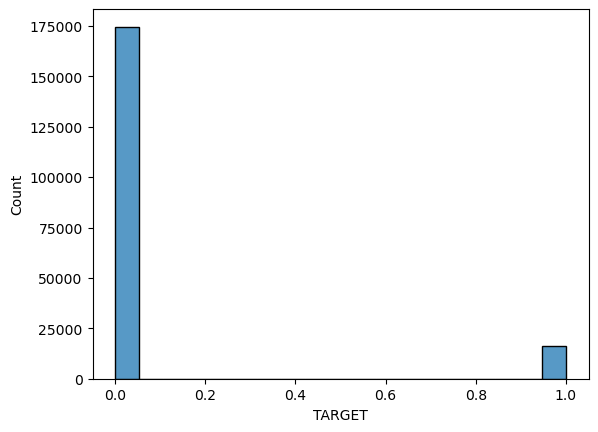

In [21]:
sns.histplot(y_train_df)

## GridSearchCV avec librairie imblearn

In [22]:
import mlflow
import mlflow.sklearn
#mlflow.set_tracking_uri("http://127.0.0.1:5000/")

# Chemin complet du répertoire de projet
project_dir = "/Users/manuelmartin67/Documents/Formation Data Scientist - Openclassrooms/Projet 7/Projet/projet7_model"

# Chemin d'accès au répertoire de stockage des expériences
tracking_uri = os.path.join(project_dir, "mlruns")

# Définir le répertoire de stockage des expériences
mlflow.set_tracking_uri(tracking_uri)

#mlflow.sklearn.autolog()

In [23]:
#from mlflow import MlflowClient

#client = MlflowClient()
#client.create_registered_model("projet7_model")

In [24]:
from sklearn.model_selection import train_test_split

In [25]:
# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_selection, y_train_df, test_size=0.2, random_state=42)

In [26]:
def searchcv_clf_smote_mlflow (clf, clf_name, param_search, X_train, X_test, y_train, y_test, searchcv = 'grid', refit = 'f1', seuil = 0.5) :
    '''
    fonction pour réaliser une validation croisée d'un classifieur, avec des données déséquilibrées
    suivi par mlflow
    
    - searchcv : 'grid' pour réaliser un grid search cv, 'random' pour réaliser un randomized search cv
    - refit : 'f1', 'fbeta' , 'roc_auc'
    
    '''
           
    import mlflow
    import mlflow.sklearn
    from sklearn.preprocessing import StandardScaler
    from imblearn.pipeline import Pipeline
    from imblearn.over_sampling import SMOTE
    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
    from sklearn.metrics import precision_recall_curve, fbeta_score, make_scorer, f1_score, roc_curve, RocCurveDisplay, auc
    from sklearn.metrics import PrecisionRecallDisplay, roc_auc_score, recall_score, precision_score

    # Début de l'exécution de ML Flow
    mlflow.start_run(run_name=clf_name)

    # Création du pipeline
    pipe = Pipeline([
        ('scale', StandardScaler()),
        ('smote', SMOTE(random_state=42)),
        ('clf', clf)
    ])

    # Création de l'objet SearchCV
    scoring = {'f1': 'f1_macro', 'fbeta': make_scorer(fbeta_score, beta=10), 'roc_auc': make_scorer(roc_auc_score)}
    if searchcv == 'grid' :
        search_cv = GridSearchCV(pipe, param_search, cv=5, scoring=scoring, refit=refit, n_jobs=7)
    if searchcv == 'random' :
        search_cv = RandomizedSearchCV(pipe, param_search, cv=5, scoring=scoring, refit=refit, n_jobs=7, n_iter=50)
    
    # Enregistrement des paramètres et des métriques dans ML Flow
    mlflow.log_param("param_search", param_search)
    mlflow.log_param("scoring", scoring)
    mlflow.log_param("refit", refit)
    mlflow.log_param("seuil", seuil)

    # Entraînement du modèle
    search_cv.fit(X_train, y_train)

    # Afficher les meilleurs hyperparamètres et scores
    # Enregistrer les hyperparamètres optimaux et scores associés dans MLflow
    mlflow.log_params(search_cv.best_params_)
    mlflow.log_metric("searchcv_split0_f1_score",
                      search_cv.cv_results_['split0_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split1_f1_score",
                      search_cv.cv_results_['split1_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split2_f1_score",
                      search_cv.cv_results_['split2_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split3_f1_score",
                      search_cv.cv_results_['split3_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split4_f1_score",
                      search_cv.cv_results_['split4_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_mean_f1_score",
                      search_cv.cv_results_['mean_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_std_f1_score",
                      search_cv.cv_results_['std_test_f1'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split0_fbeta_score",
                      search_cv.cv_results_['split0_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split1_fbeta_score",
                      search_cv.cv_results_['split1_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split2_fbeta_score",
                      search_cv.cv_results_['split2_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split3_fbeta_score",
                      search_cv.cv_results_['split3_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split4_fbeta_score",
                      search_cv.cv_results_['split4_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_mean_fbeta_score",
                      search_cv.cv_results_['mean_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_std_fbeta_score",
                      search_cv.cv_results_['std_test_fbeta'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split0_roc_auc",
                      search_cv.cv_results_['split0_test_roc_auc'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split1_roc_auc",
                      search_cv.cv_results_['split1_test_roc_auc'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split2_roc_auc",
                      search_cv.cv_results_['split2_test_roc_auc'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split3_roc_auc",
                      search_cv.cv_results_['split3_test_roc_auc'][search_cv.best_index_])
    mlflow.log_metric("searchcv_split4_roc_auc",
                      search_cv.cv_results_['split4_test_roc_auc'][search_cv.best_index_])
    mlflow.log_metric("searchcv_mean_roc_auc",
                      search_cv.cv_results_['mean_test_roc_auc'][search_cv.best_index_])
    mlflow.log_metric("searchcv_std_roc_auc",
                      search_cv.cv_results_['std_test_roc_auc'][search_cv.best_index_])
    
    #Calcul des metrics pour la base d'entrainement en fonction du seuil
    y_pred_proba_train = search_cv.predict_proba(X_train)[:, 1]
    y_pred_train = (y_pred_proba_train > seuil).astype(int)
    train_roc_auc = roc_auc_score(y_train, y_pred_train)
    train_precision_s = precision_score(y_train, y_pred_train)
    train_recall_s = recall_score(y_train, y_pred_train)
    train_f1_s = f1_score(y_train, y_pred_train)
    train_fb_s = fbeta_score(y_train, y_pred_train, beta=10)

    # Enregistrement des scores sur la base d'entrainement dans ML Flow
    mlflow.log_metric("train_roc_auc", train_roc_auc)
    mlflow.log_metric("train_precision", train_precision_s)
    mlflow.log_metric("train_recall", train_recall_s)
    mlflow.log_metric("train_f1_score", train_f1_s)
    mlflow.log_metric("train_fbeta_score", train_fb_s)
    
    #Calcul des metrics pour la base de test en fonction du seuil
    y_pred_proba_test = search_cv.predict_proba(X_test)[:, 1]
    y_pred_test = (y_pred_proba_test > seuil).astype(int)
    test_roc_auc = roc_auc_score(y_test, y_pred_test)
    test_precision_s = precision_score(y_test, y_pred_test)
    test_recall_s = recall_score(y_test, y_pred_test)
    test_f1_s = f1_score(y_test, y_pred_test)
    test_fb_s = fbeta_score(y_test, y_pred_test, beta=10)

    # Enregistrement des scores sur la base de test dans ML Flow
    mlflow.log_metric("test_roc_auc", test_roc_auc)
    mlflow.log_metric("test_precision", test_precision_s)
    mlflow.log_metric("test_recall", test_recall_s)
    mlflow.log_metric("test_f1_score", test_f1_s)
    mlflow.log_metric("test_fbeta_score", test_fb_s)

    #full_artifact_path = "./mlruns/0/" + mlflow.active_run().info.run_id + "/artifacts/"
    
    # Traçage de la courbe roc auc
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_test)
    roc_auc = auc(fpr, tpr)
    display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name=clf_name).plot()
    #artifact_path = full_artifact_path + "roc_curve.png"
    plt.savefig("roc_curve.png")  # Sauvegarde de l'image
    mlflow.log_artifact("roc_curve.png")
    plt.show()
    
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

    # plot pour voir le nombre de FP et FN en fonction du seuil
    # Création d'une liste de seuils à tester
    seuils = np.arange(0, 1, 0.01)

    # Initialisez une liste pour stocker le nombre de FN pour chaque seuil
    fp_list = []
    fn_list = []
    fbeta_list = []

    # Pour chaque seuil, calculez le nombre de FN et stockez-le dans la liste
    for seuil_test in seuils:
        y_pred = (y_pred_proba_test >= seuil_test).astype(int)
        fp = np.sum((y_test == 0) & (y_pred == 1))
        fp_list.append(fp)
        fn = (np.sum((y_test == 1) & (y_pred == 0)))*10 # on multiplie par 10 pour avoir beta = 10
        fn_list.append(fn)

    # Tracez le nombre de FN en fonction du seuil
    plt.plot(seuils, fp_list, label="FP")
    plt.plot(seuils, fn_list, label="FN")
    plt.xlabel('Seuil')
    plt.ylabel('Nombre de FP et Nombre de FN x10')
    plt.legend()
    #artifact_path = full_artifact_path + "/fp_fnx10_seuil.png"
    plt.savefig("fp_fnx10_seuil.png")  # Sauvegarde de l'image
    mlflow.log_artifact("fp_fnx10_seuil.png")
    
    # Convertir X_test en tableau NumPy
    X_test_array = X_test.to_numpy()
    # Calculer les erreurs de prédiction
    errors = y_pred_test - y_test
    # Récupérer les noms des features
    feature_names = X_test.columns
    
    
    # Calculer le nombre d'erreurs pour chaque valeur de variable
    error_counts = {}
    for feature_idx in np.arange(X_test_array.shape[1]):
        unique_values, counts = np.unique(X_test_array[:, feature_idx], return_counts=True)
        unique_values_errors, nb_error = np.unique(X_test_array[:, feature_idx][errors != 0], return_counts=True)
        error_counts[feature_idx] = {}
        for value, count in zip(unique_values, counts):
            if value in unique_values_errors:
                error_counts[feature_idx][value] = nb_error[unique_values_errors == value][0] / count
            else:
                error_counts[feature_idx][value] = 0


    # Afficher le nombre d'erreurs en fonction des variables
    for feature_idx, counts in error_counts.items():
        plt.figure()
        values = list(counts.keys())
        error_values = list(counts.values())
        plt.scatter(values, error_values, marker='o')
        plt.xlabel(feature_names[feature_idx])
        plt.ylabel('Pourcentage d\'erreurs')
        plt.title('Pourcentage d\'erreurs en fonction de {}'.format(feature_names[feature_idx]))
        #artifact_path = full_artifact_path + "/pourcentage_erreurs_" +feature_names[feature_idx]+".png"
        plt.savefig("pourcentage_erreurs_" +feature_names[feature_idx]+".png")  # Sauvegarde de l'image
        mlflow.log_artifact("pourcentage_erreurs_" +feature_names[feature_idx]+".png")
    
    # Matrice de confusion
    conf_matrix = confusion_matrix(y_test, y_pred_test)
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=search_cv.classes_)
    disp.plot()
    #artifact_path = full_artifact_path + "/confusion_matrix.png"
    plt.savefig("confusion_matrix.png")  # Sauvegarde de l'image
    mlflow.log_artifact("confusion_matrix.png")
    
    mlflow.sklearn.log_model(search_cv,"model",registered_model_name="projet7_model")
    
    #mlflow.register_model("runs:/" + mlflow.active_run().info.run_id + "/artifacts/model", "projet7_model")
    
    
    # Fin de l'exécution de ML Flow
    mlflow.end_run()
    
    return search_cv

In [27]:
mlflow.end_run()

## Dummy Classifier

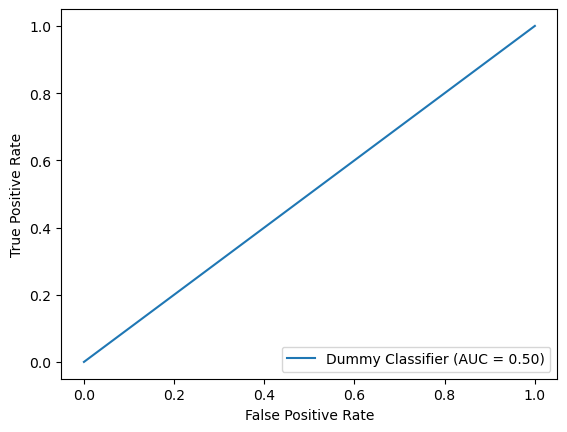

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:44:03 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 22
Created version '22' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        DummyClassifier(random_state=42))]),
             n_jobs=7,
             param_grid={'clf__strategy': ['most_frequent', 'prior',
                                           'stratified', 'uniform',
                                           'constant']},
             refit='f1',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

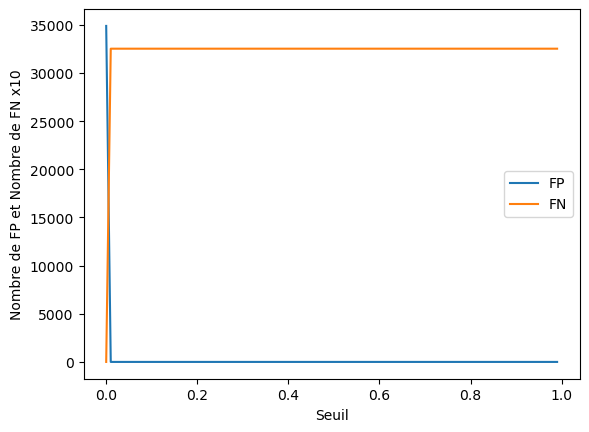

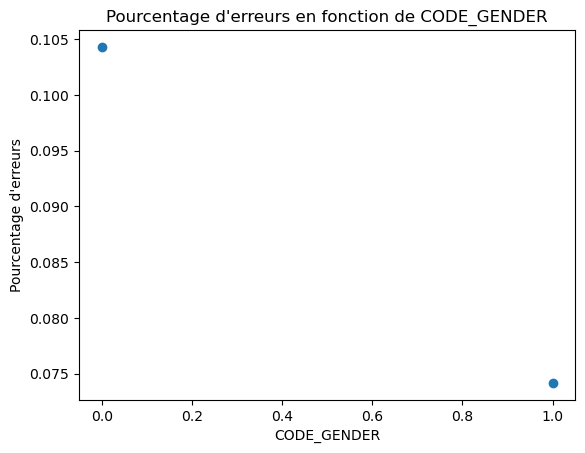

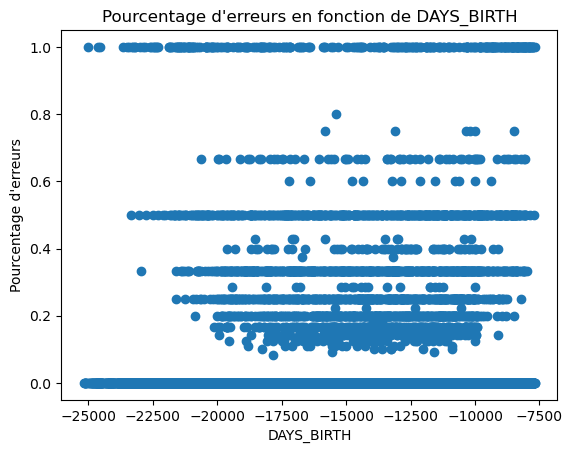

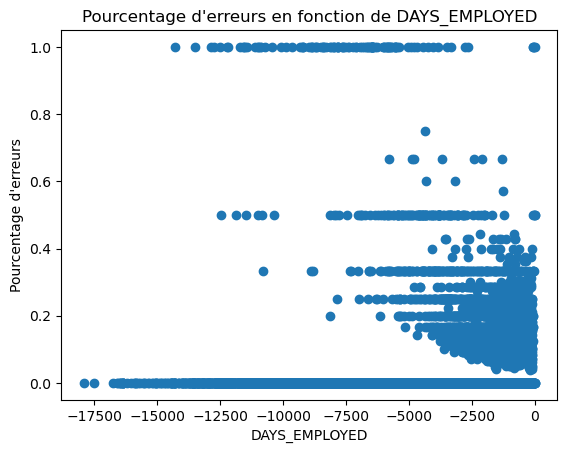

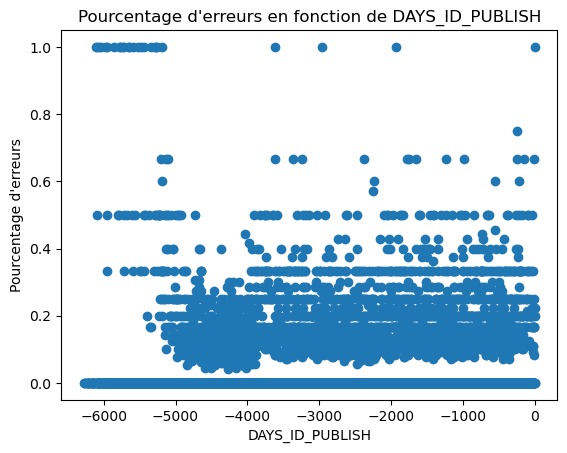

...

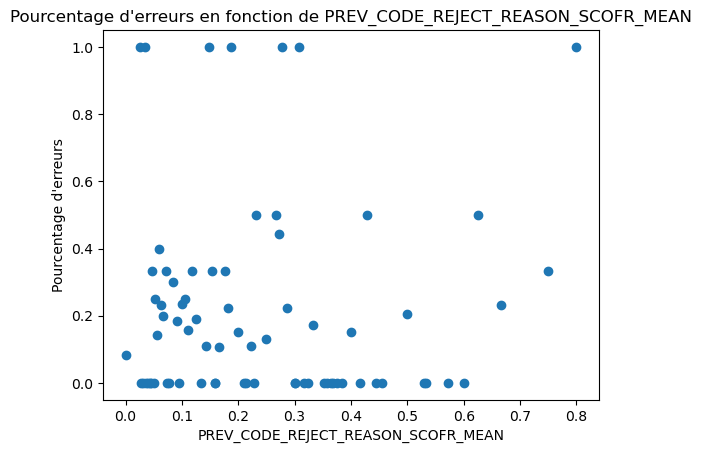

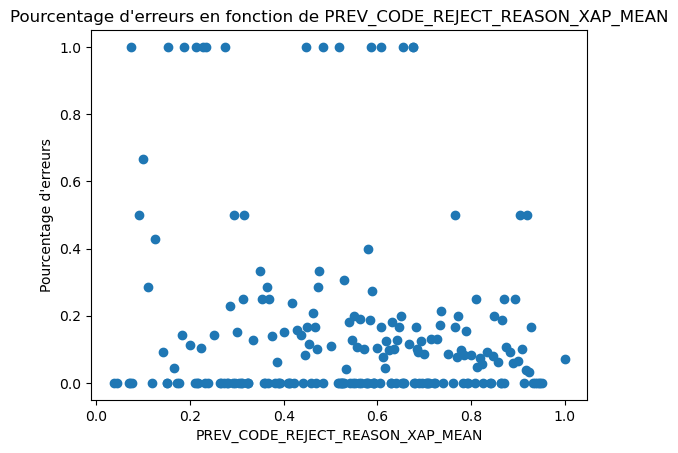

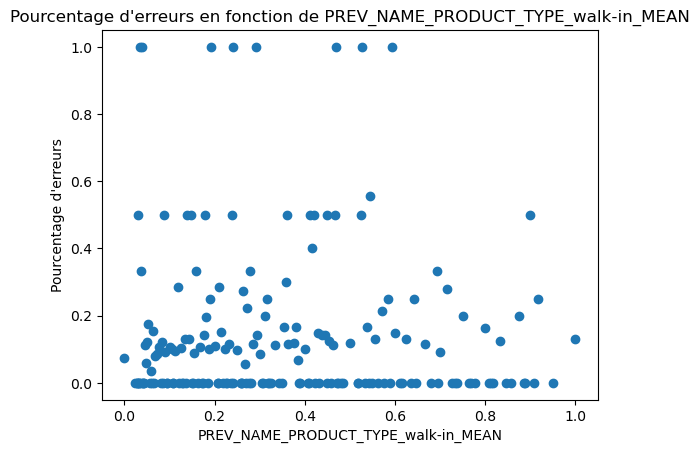

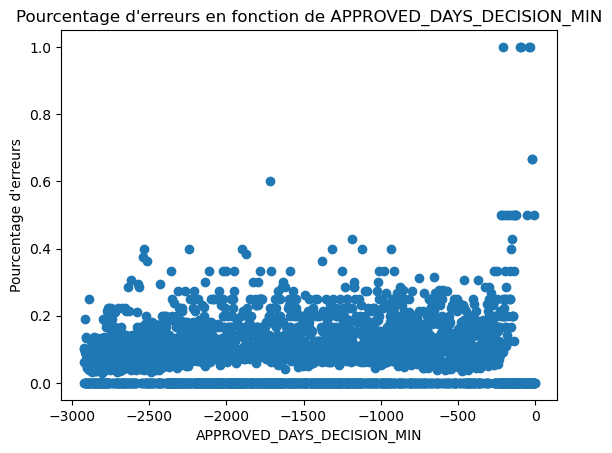

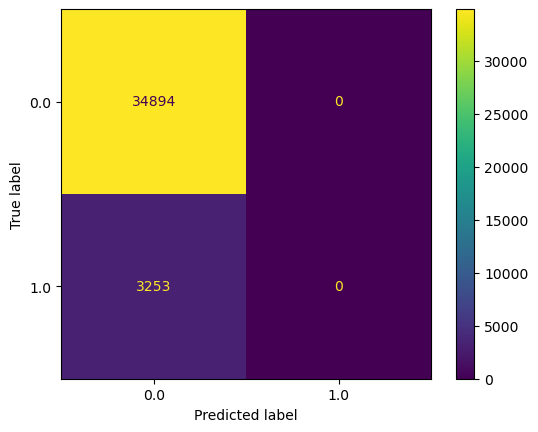

In [61]:
from sklearn.dummy import DummyClassifier

dc_name="Dummy Classifier"
dc = DummyClassifier(random_state=42)
dc_param_search = {'clf__strategy': ['most_frequent', 'prior', 'stratified','uniform', 'constant']}

searchcv_clf_smote_mlflow(dc, dc_name, dc_param_search, X_train, X_test, y_train, y_test,searchcv = 'grid', refit = 'f1', seuil = 0.45)

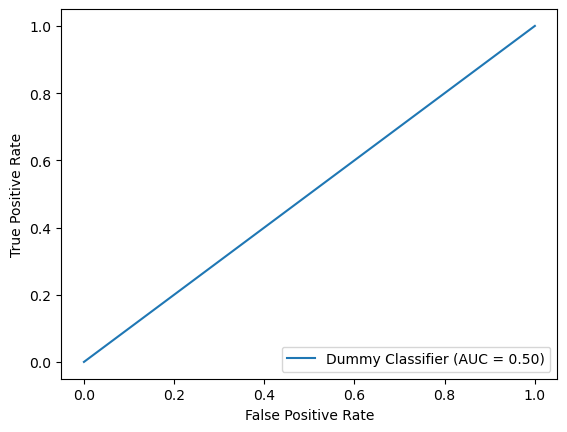

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:44:11 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 23
Created version '23' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        DummyClassifier(random_state=42))]),
             n_jobs=7,
             param_grid={'clf__strategy': ['most_frequent', 'prior',
                                           'stratified', 'uniform',
                                           'constant']},
             refit='fbeta',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

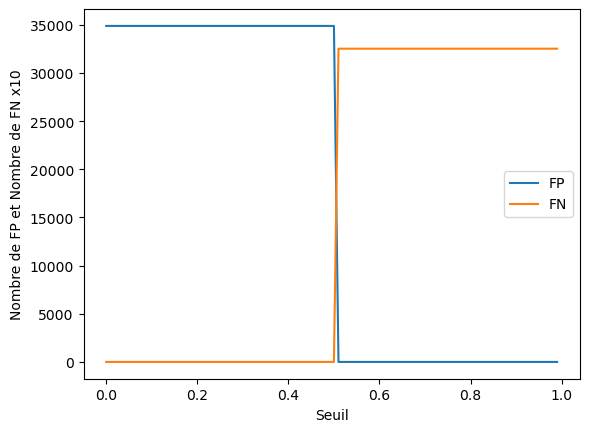

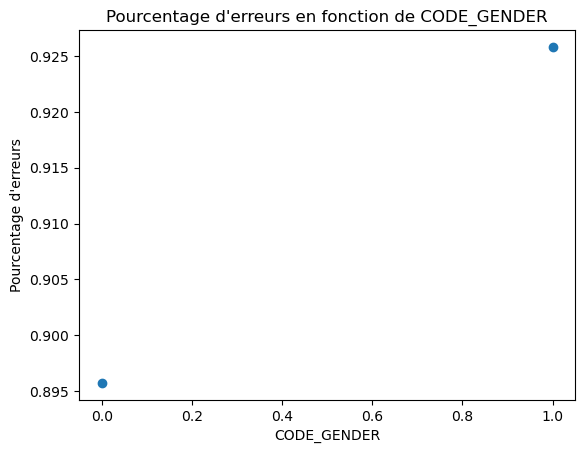

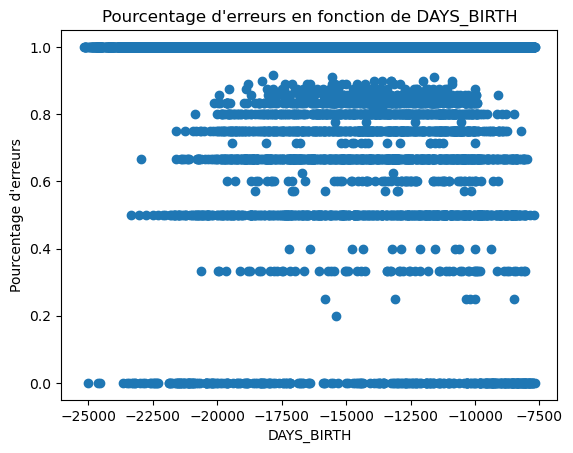

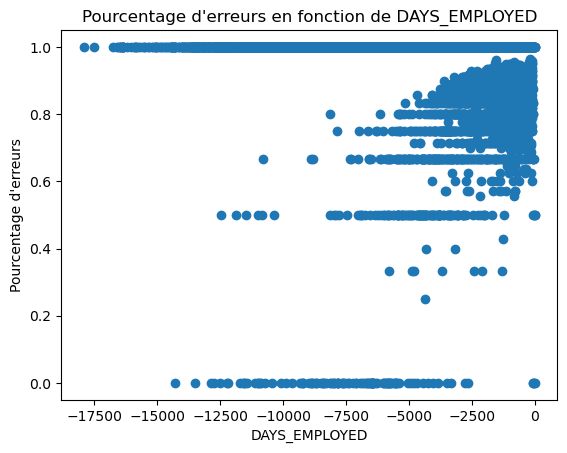

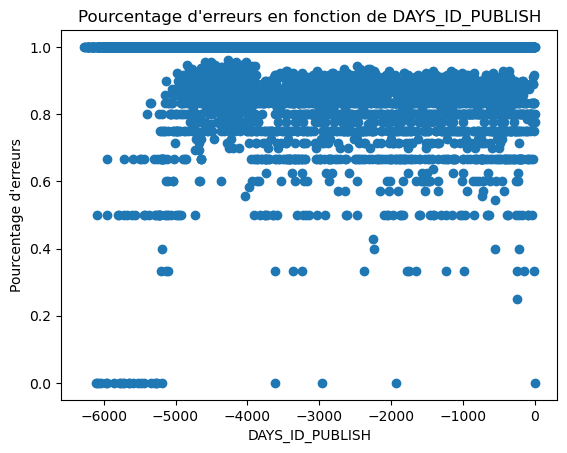

...

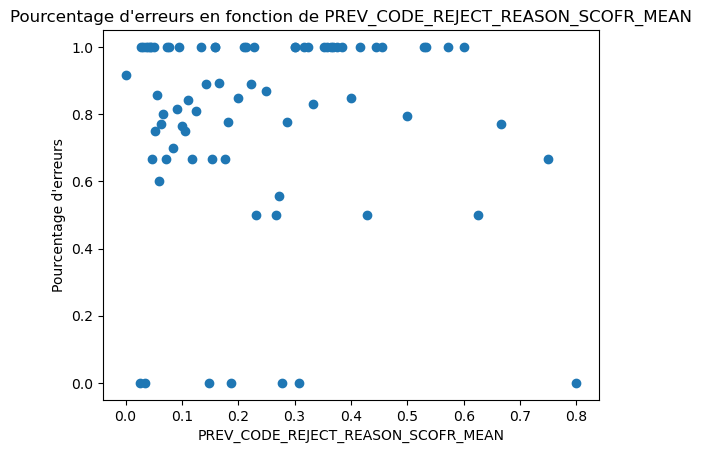

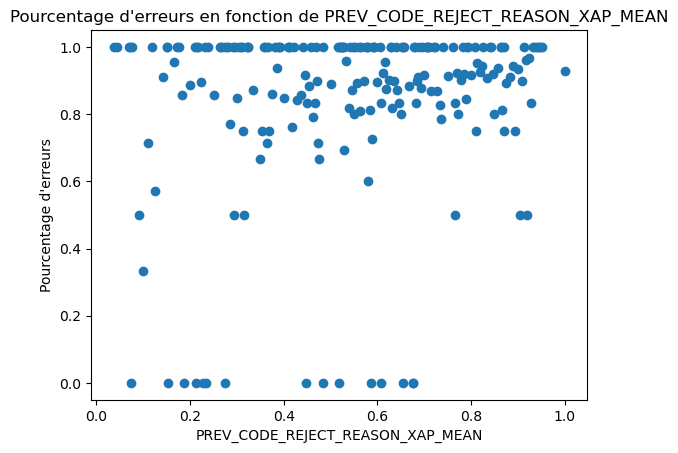

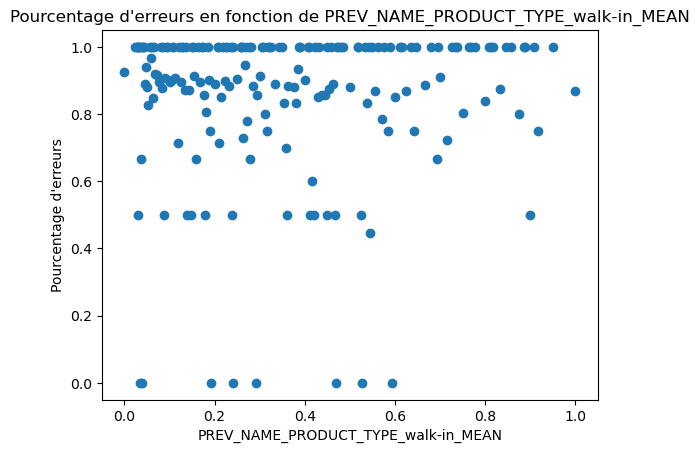

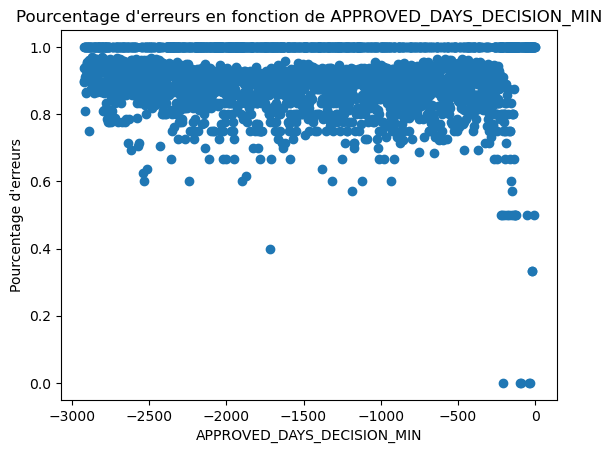

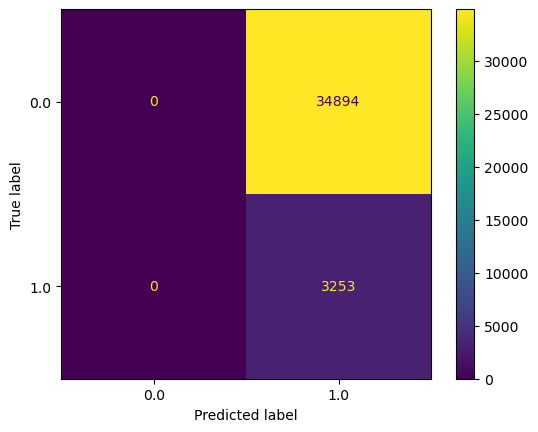

In [62]:
from sklearn.dummy import DummyClassifier

dc_name="Dummy Classifier"
dc = DummyClassifier(random_state=42)
dc_param_search = {'clf__strategy': ['most_frequent', 'prior', 'stratified','uniform', 'constant']}

searchcv_clf_smote_mlflow(dc, dc_name, dc_param_search, X_train, X_test, y_train, y_test,searchcv = 'grid', refit = 'fbeta', seuil = 0.45)

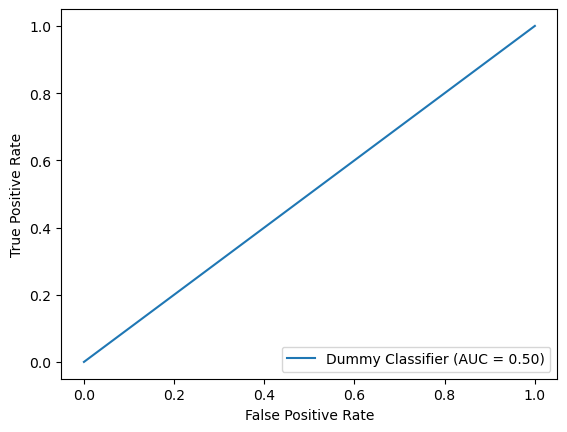

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:44:20 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 24
Created version '24' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        DummyClassifier(random_state=42))]),
             n_jobs=7,
             param_grid={'clf__strategy': ['most_frequent', 'prior',
                                           'stratified', 'uniform',
                                           'constant']},
             refit='roc_auc',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

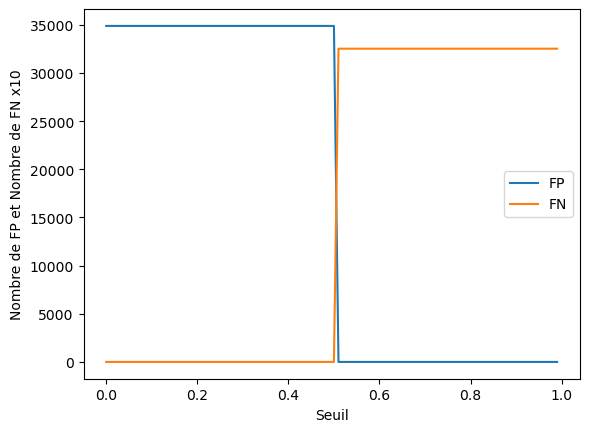

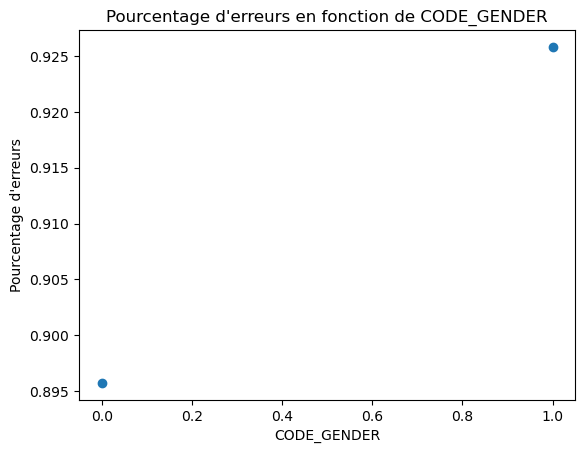

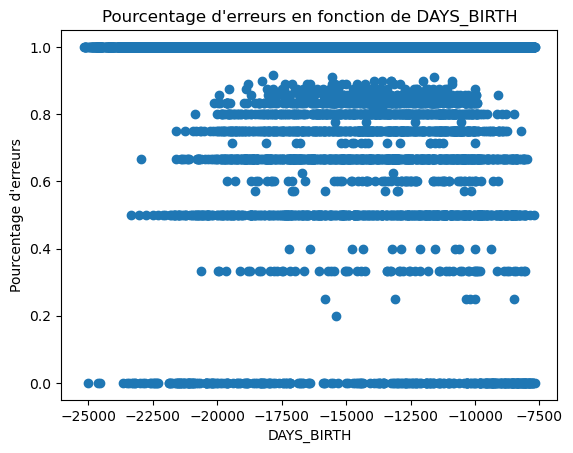

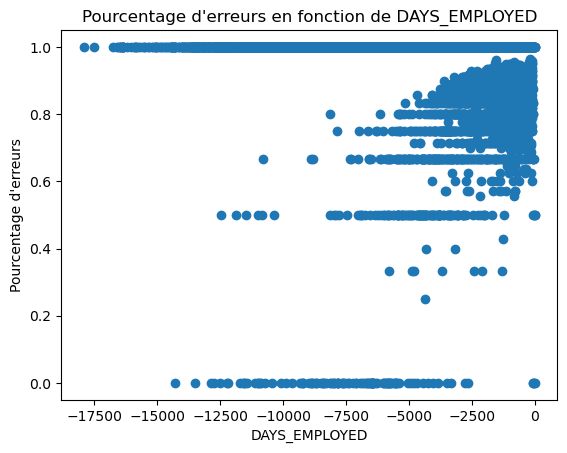

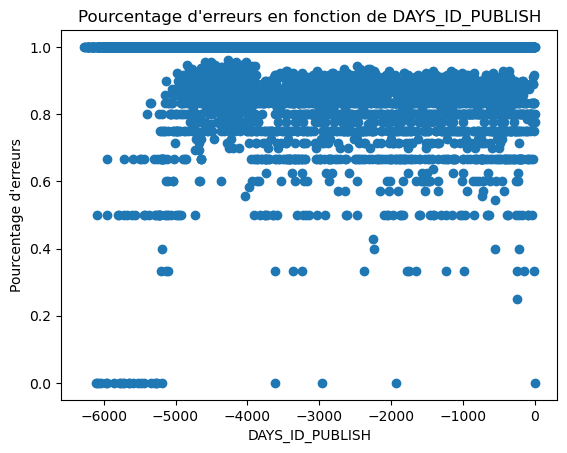

...

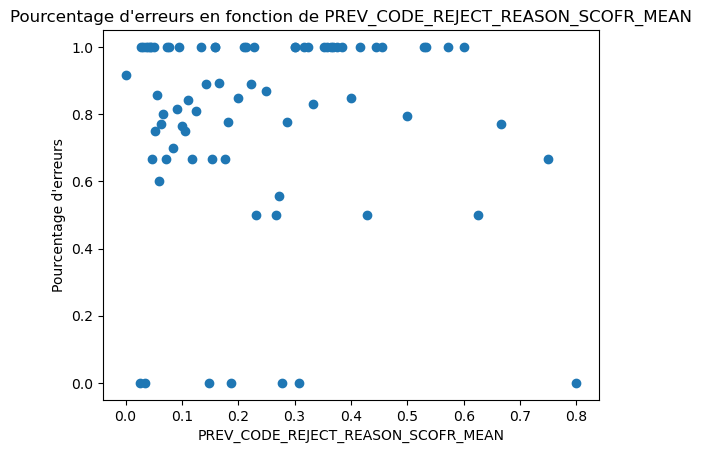

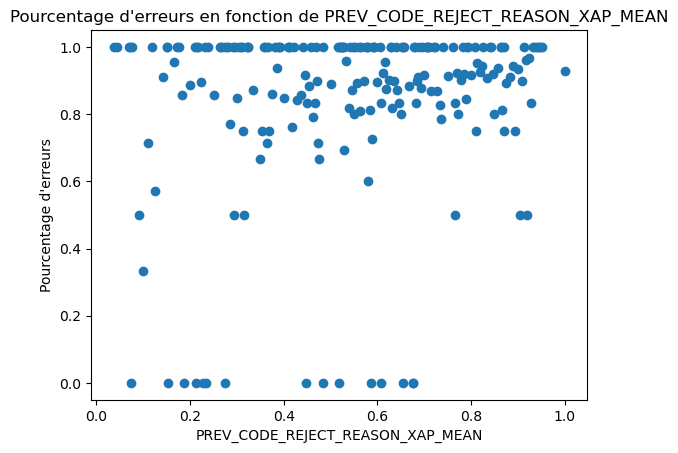

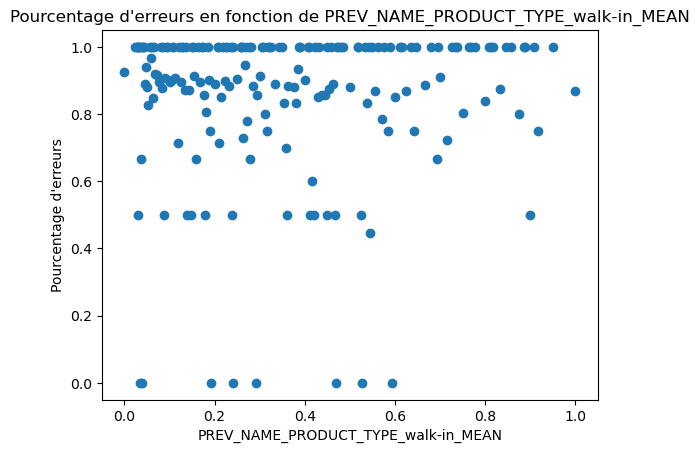

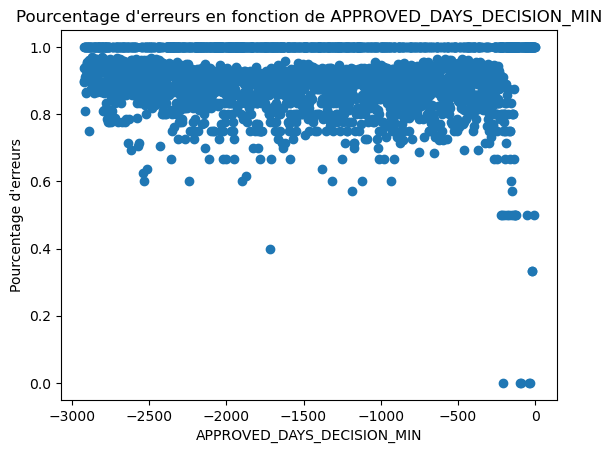

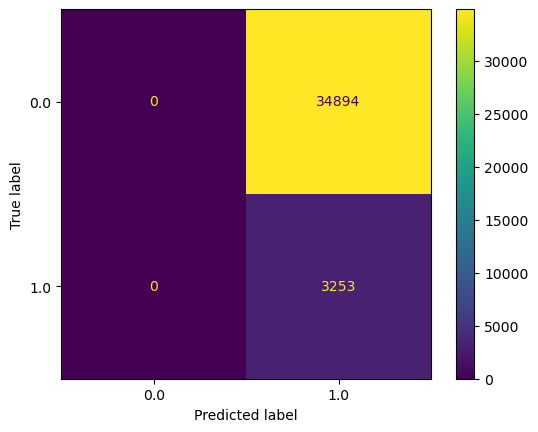

In [63]:
from sklearn.dummy import DummyClassifier

dc_name="Dummy Classifier"
dc = DummyClassifier(random_state=42)
dc_param_search = {'clf__strategy': ['most_frequent', 'prior', 'stratified','uniform', 'constant']}

searchcv_clf_smote_mlflow(dc, dc_name, dc_param_search, X_train, X_test, y_train, y_test,searchcv = 'grid', refit = 'roc_auc', seuil = 0.45)

## Regression Logistic

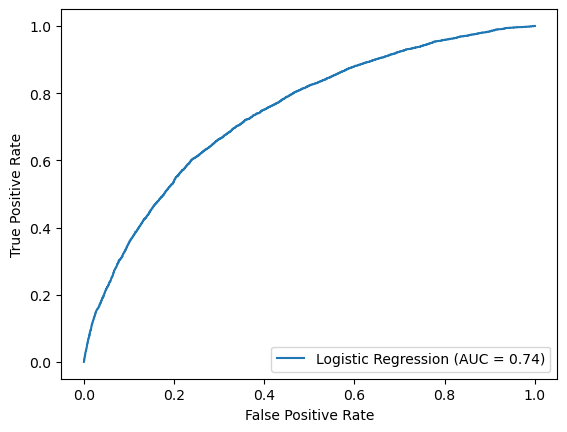

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:44:30 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 25
Created version '25' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        LogisticRegression(max_iter=1000,
                                                           random_state=42))]),
             n_jobs=7, param_grid={'clf__C': [0.01, 0.1, 1]}, refit='f1',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

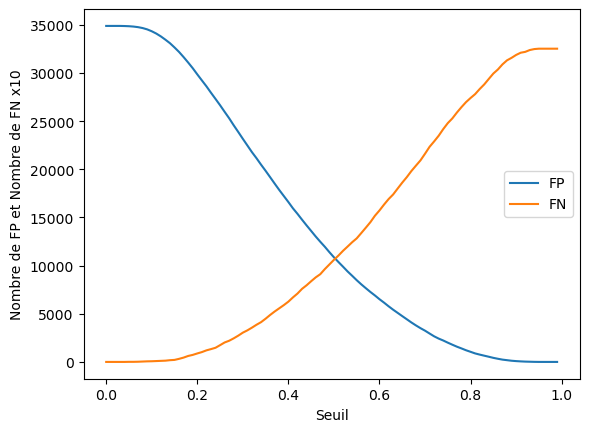

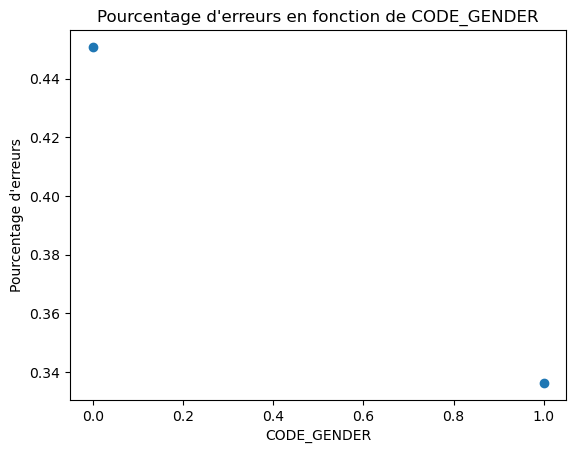

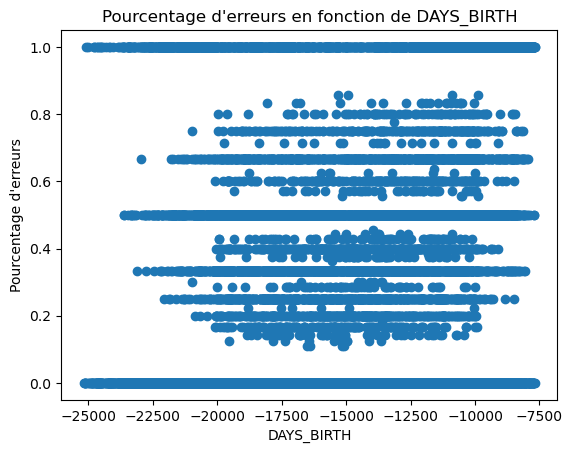

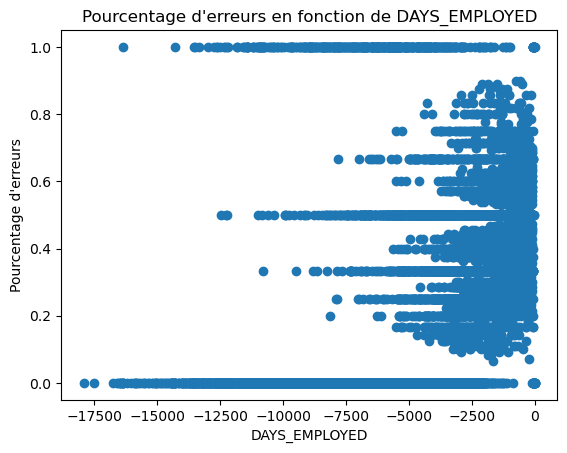

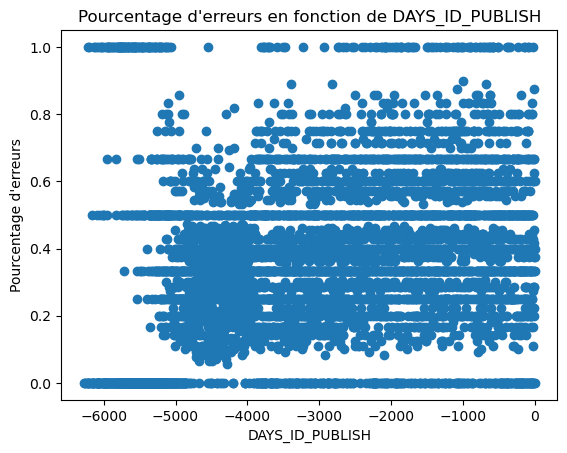

...

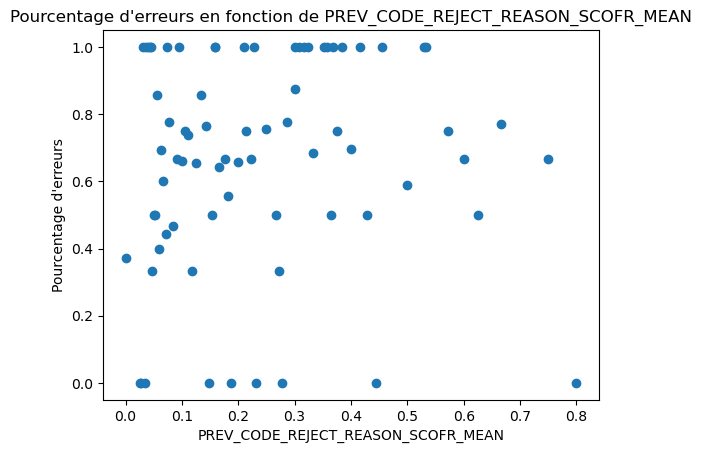

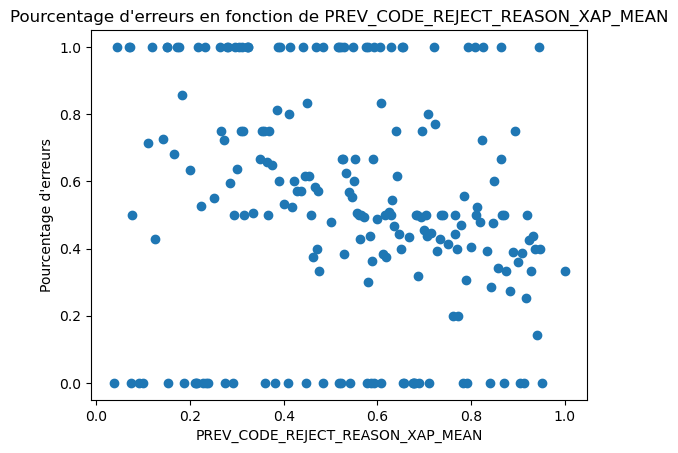

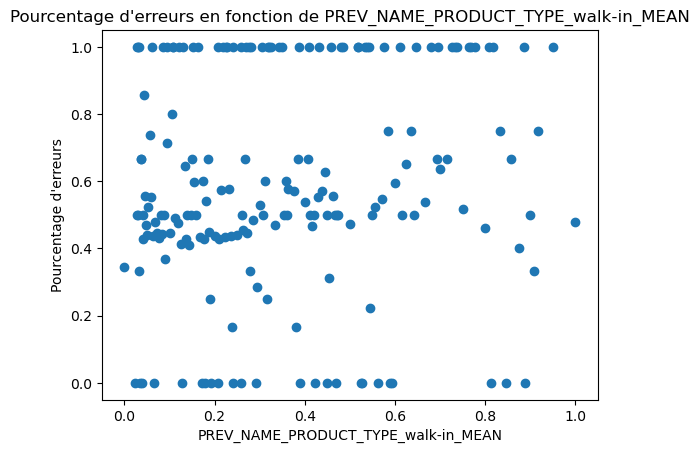

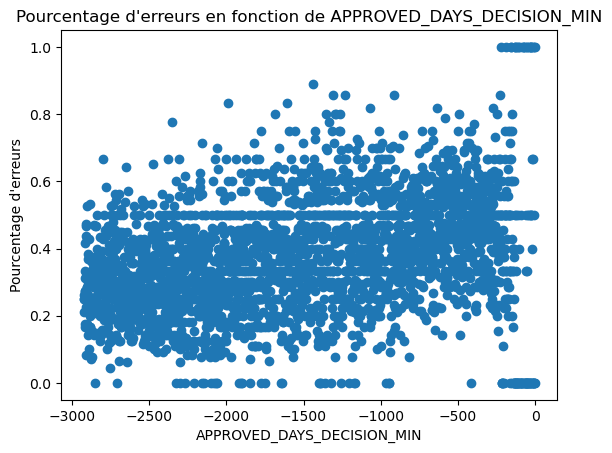

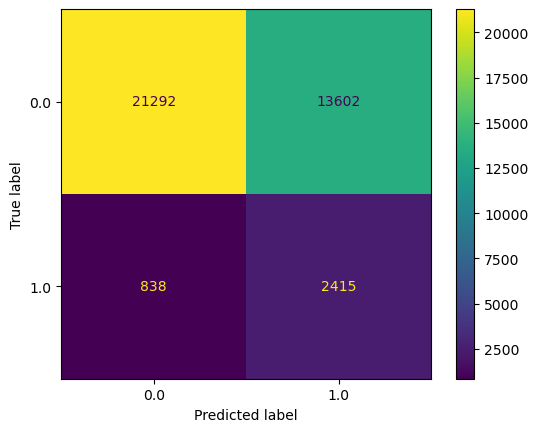

In [64]:
from sklearn.linear_model import LogisticRegression

lr_name="Logistic Regression"
lr = LogisticRegression(max_iter=1000, random_state=42)
lr_param_search = {'clf__C': [0.01, 0.1, 1]}

searchcv_clf_smote_mlflow(lr, lr_name, lr_param_search, X_train, X_test, y_train, y_test,
                          searchcv = 'grid', refit = 'f1', seuil = 0.45)

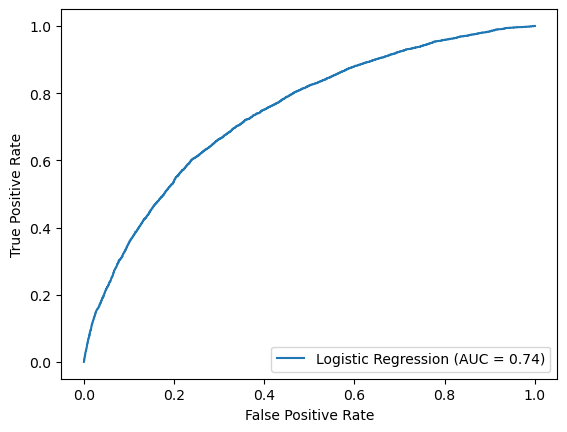

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:44:40 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 26
Created version '26' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        LogisticRegression(max_iter=1000,
                                                           random_state=42))]),
             n_jobs=7, param_grid={'clf__C': [0.01, 0.1, 1]}, refit='fbeta',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

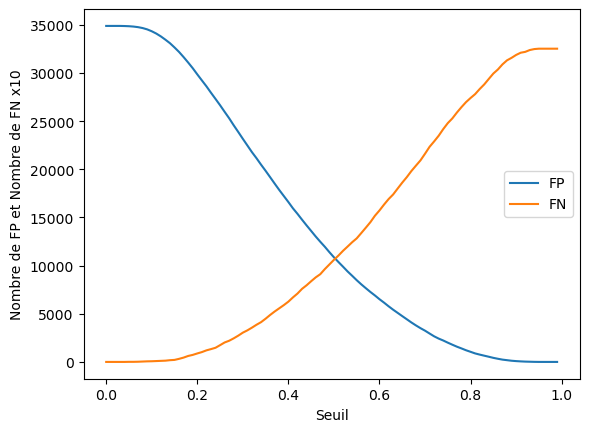

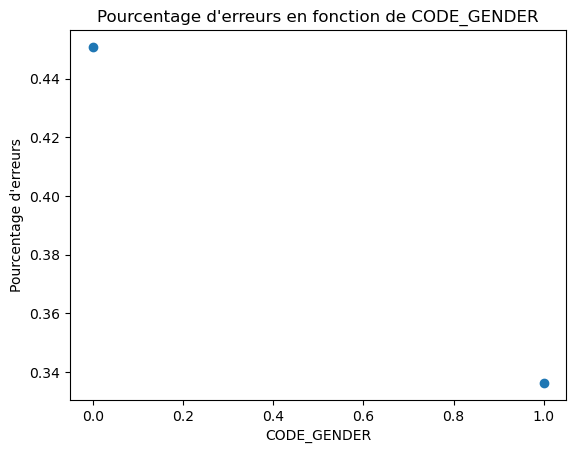

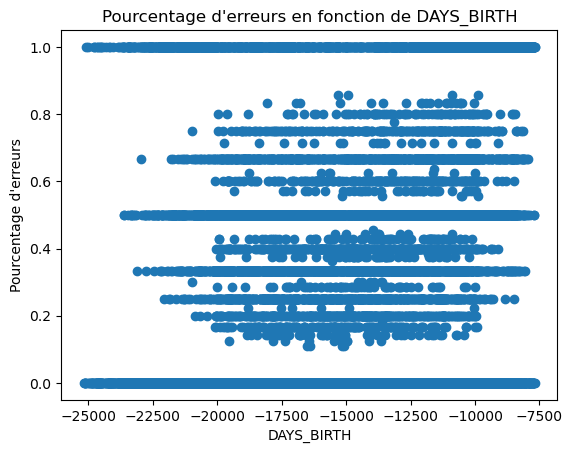

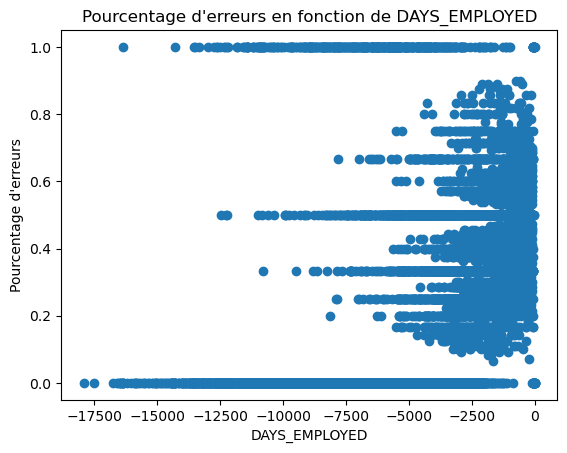

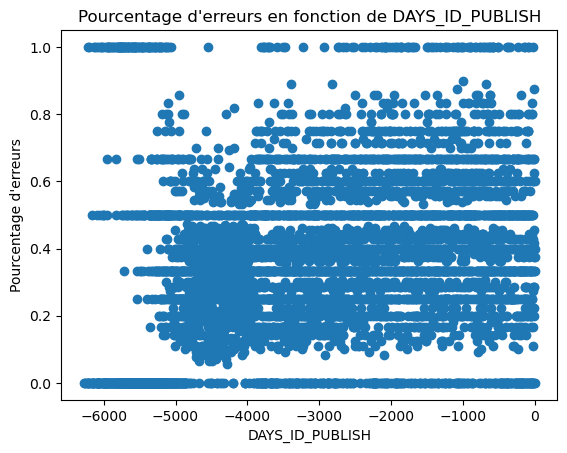

...

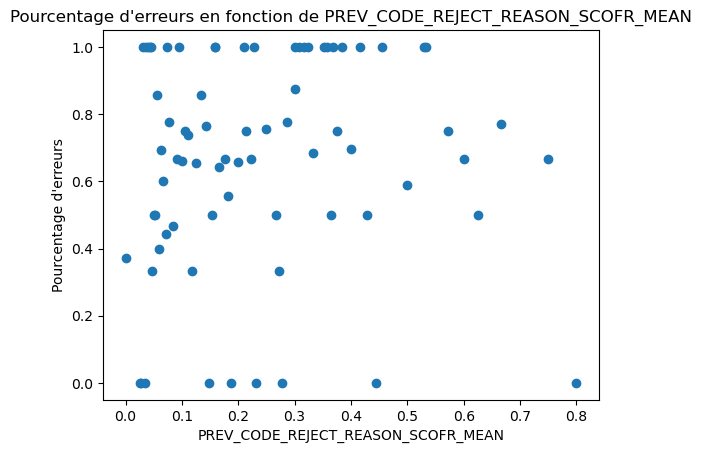

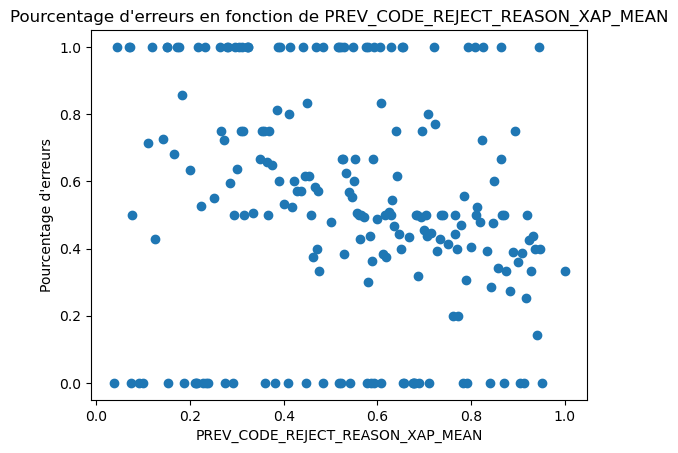

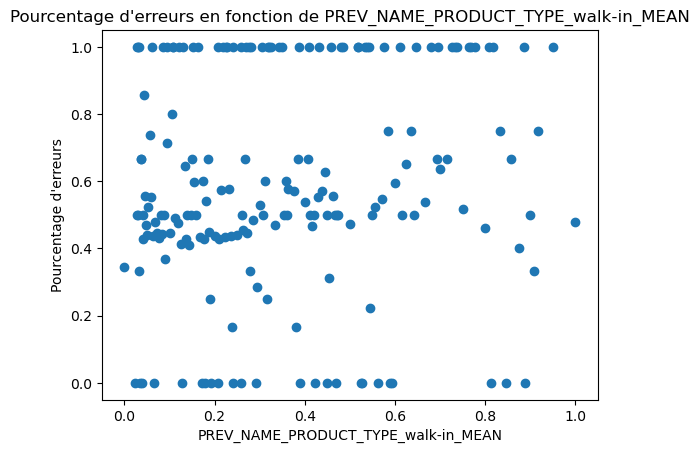

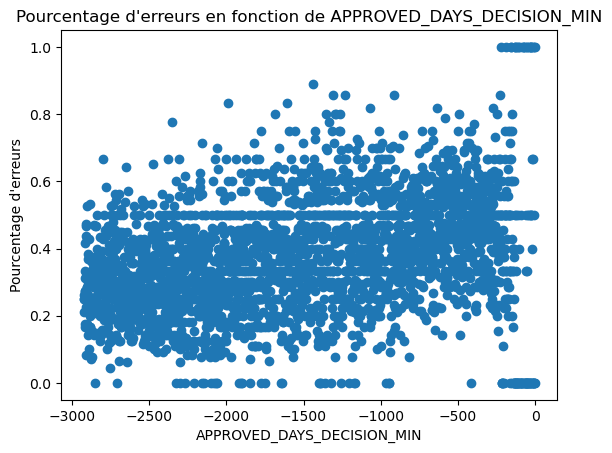

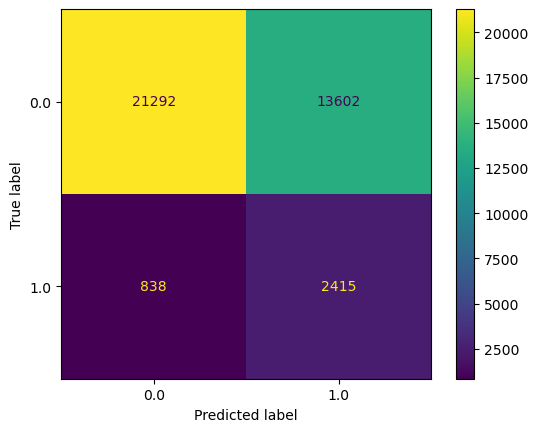

In [65]:
from sklearn.linear_model import LogisticRegression

lr_name="Logistic Regression"
lr = LogisticRegression(max_iter=1000, random_state=42)
lr_param_search = {'clf__C': [0.01, 0.1, 1]}

searchcv_clf_smote_mlflow(lr, lr_name, lr_param_search, X_train, X_test, y_train, y_test,
                          searchcv = 'grid', refit = 'fbeta', seuil = 0.45)

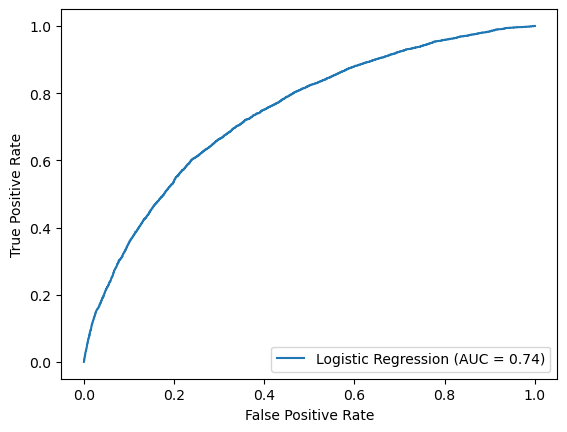

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:44:50 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 27
Created version '27' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        LogisticRegression(max_iter=1000,
                                                           random_state=42))]),
             n_jobs=7, param_grid={'clf__C': [0.01, 0.1, 1]}, refit='roc_auc',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

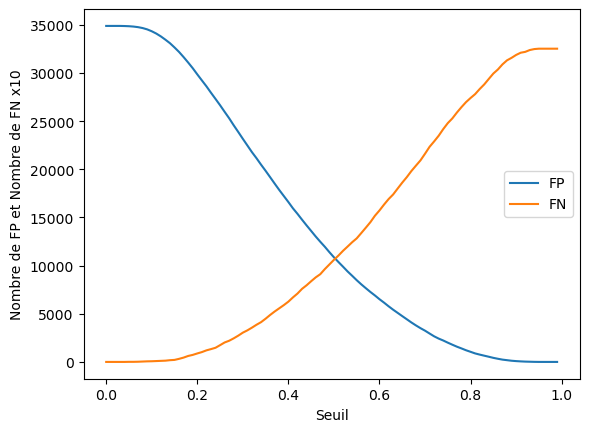

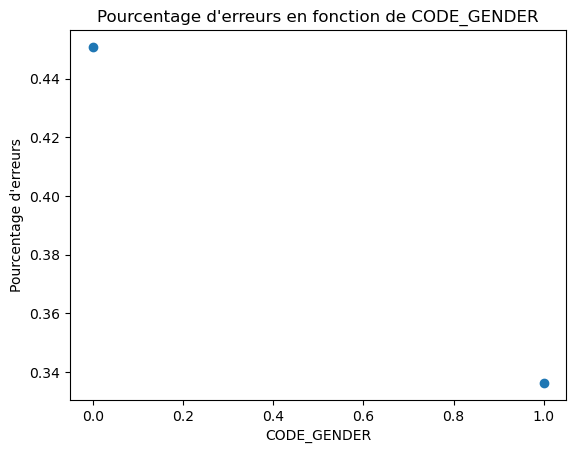

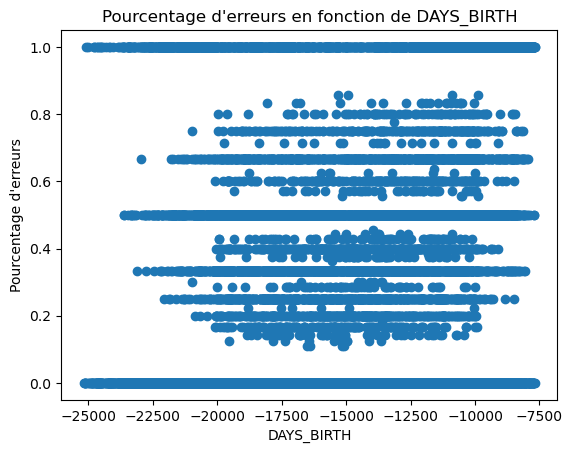

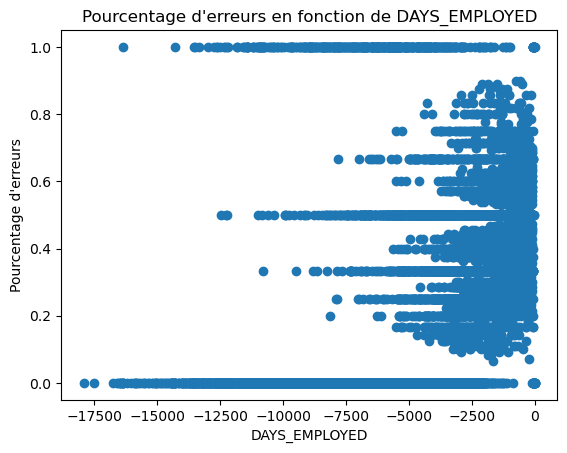

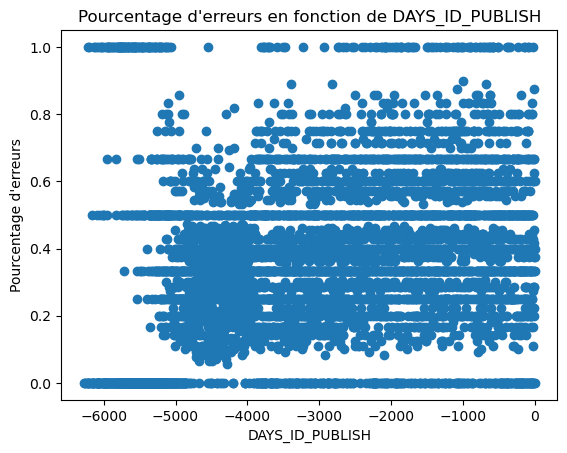

...

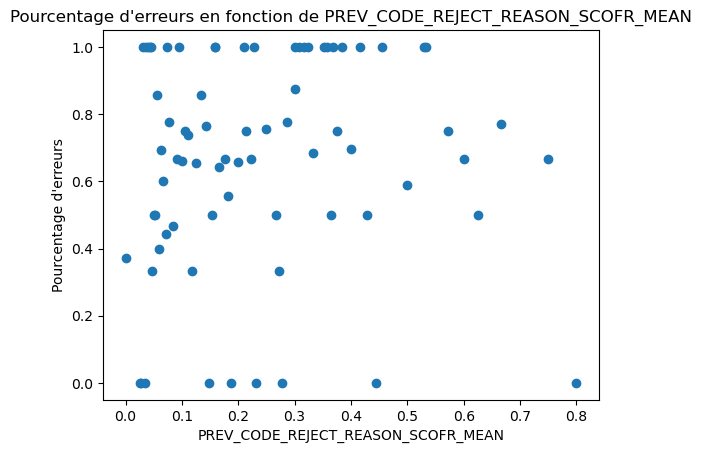

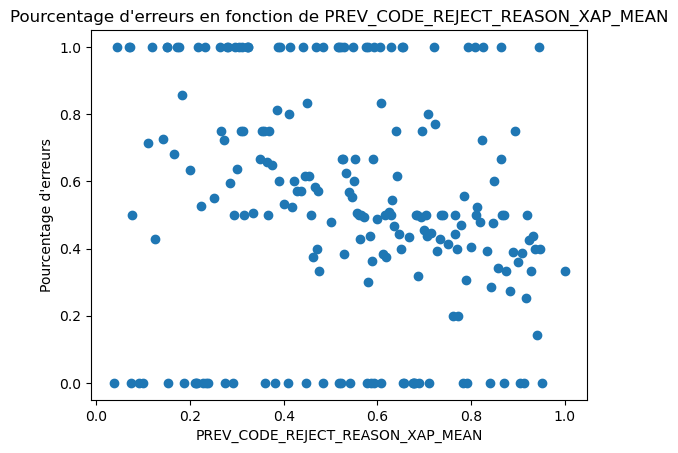

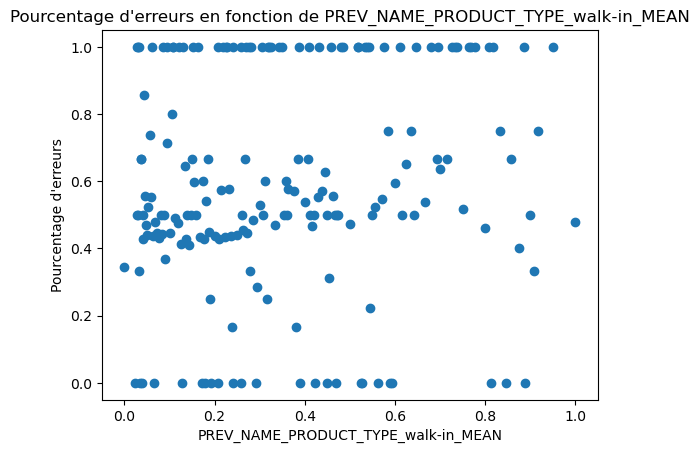

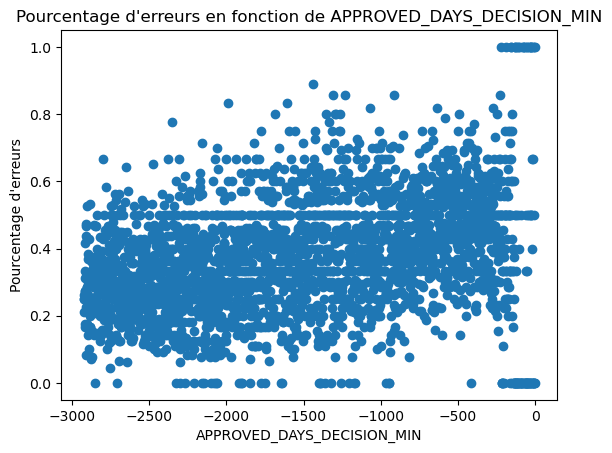

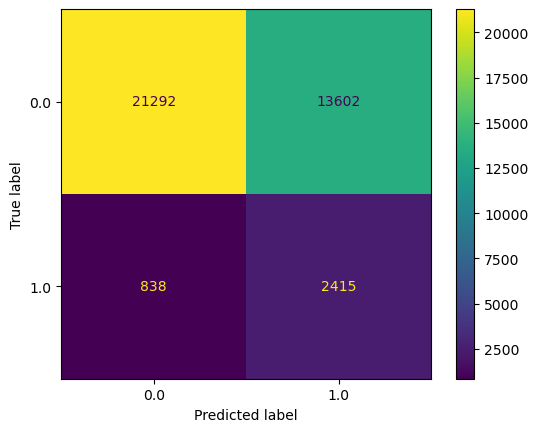

In [66]:
from sklearn.linear_model import LogisticRegression

lr_name="Logistic Regression"
lr = LogisticRegression(max_iter=1000, random_state=42)
lr_param_search = {'clf__C': [0.01, 0.1, 1]}

searchcv_clf_smote_mlflow(lr, lr_name, lr_param_search, X_train, X_test, y_train, y_test,
                          searchcv = 'grid', refit = 'roc_auc', seuil = 0.45)

In [67]:
mlflow.end_run()

## Random Forest

In [68]:
X_train_sub = X_train.sample(frac=0.2,random_state=42)
y_train_sub = y_train.sample(frac=0.2,random_state=42)

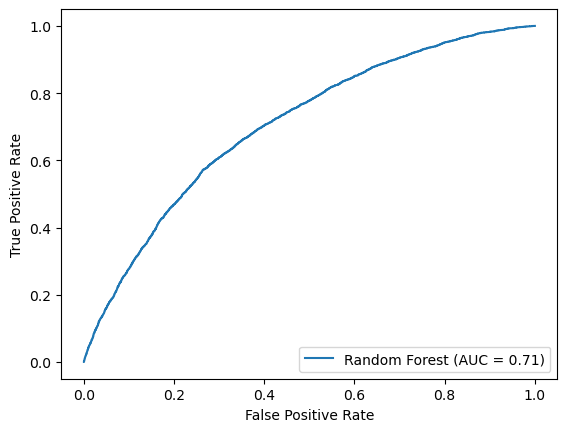

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:49:42 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 28
Created version '28' of model 'projet7_model'.


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scale', StandardScaler()),
                                             ('smote', SMOTE(random_state=42)),
                                             ('clf',
                                              RandomForestClassifier(n_jobs=7,
                                                                     random_state=42))]),
                   n_iter=50, n_jobs=7,
                   param_distributions={'clf__bootstrap': [True, False],
                                        'clf__max_depth': [None, 26, 31, 27, 30,
                                                           21, 47, 29, 40, 32],
                                        'clf__max_features': ['sqrt', 'log2'],
                                        'clf__min_samples_leaf':...e.rv_discrete_frozen object at 0x2c2bf6670>,
                                        'clf__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x2d43f2b50>,
                                        'clf__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x2aa04ddf0>},
                   refit='f1',
                   scoring={'f1': 'f1_macro',
                            'fbeta': make_scorer(fbeta_score, beta=10),
                            'roc_auc': make_scorer(roc_auc_score)})

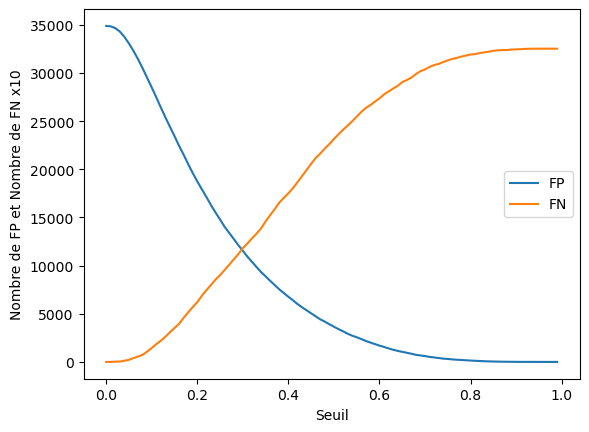

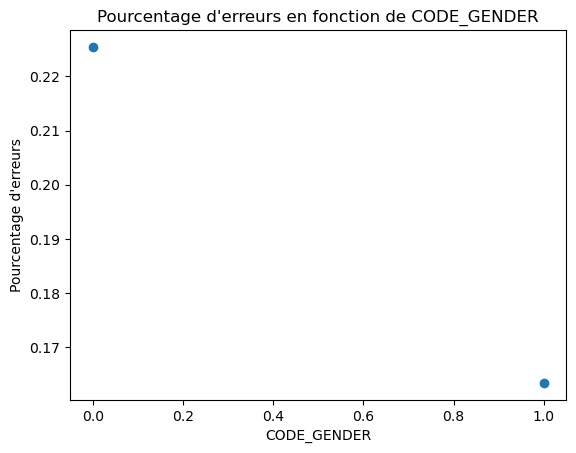

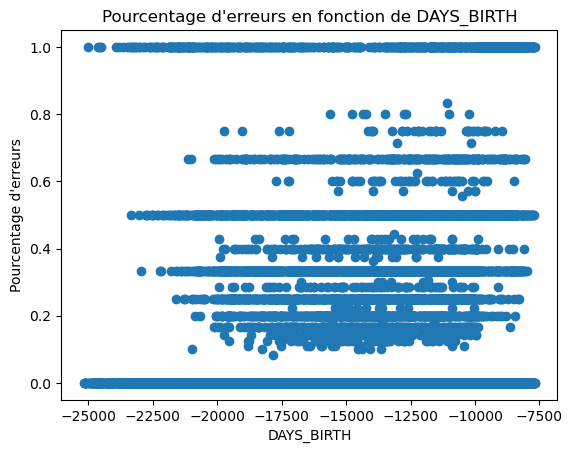

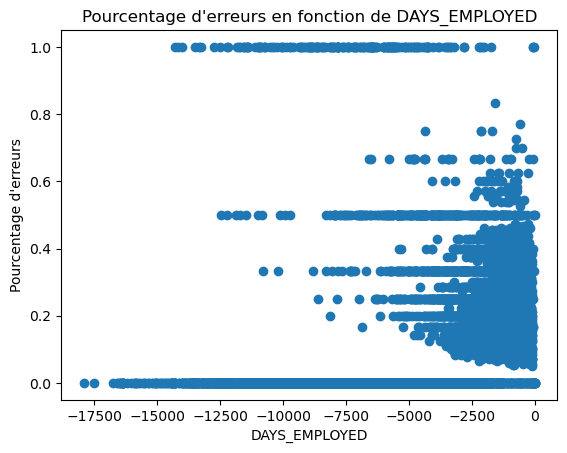

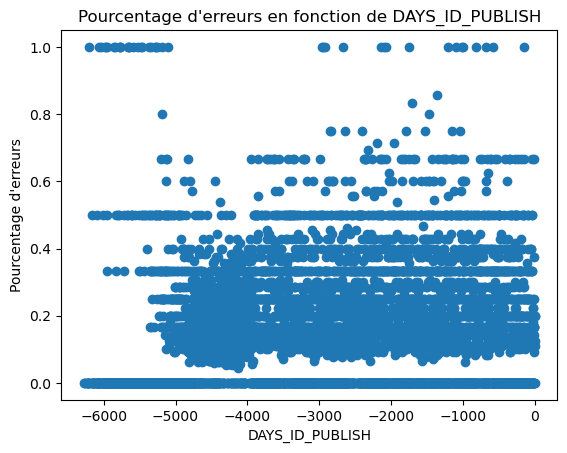

...

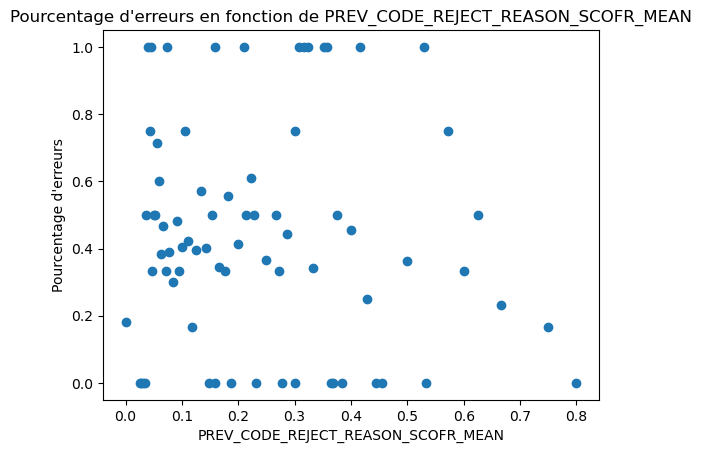

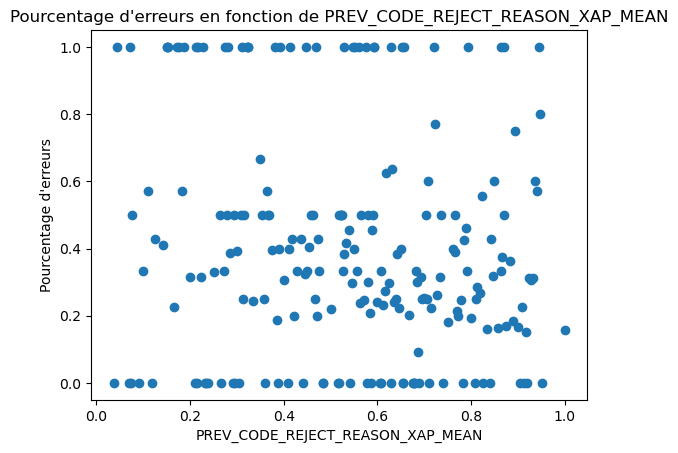

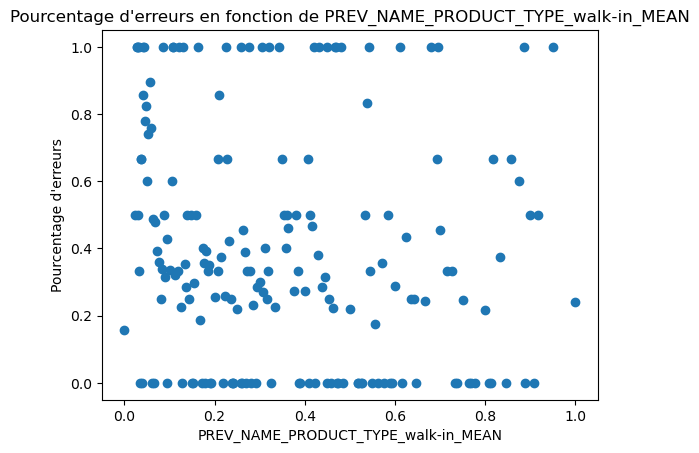

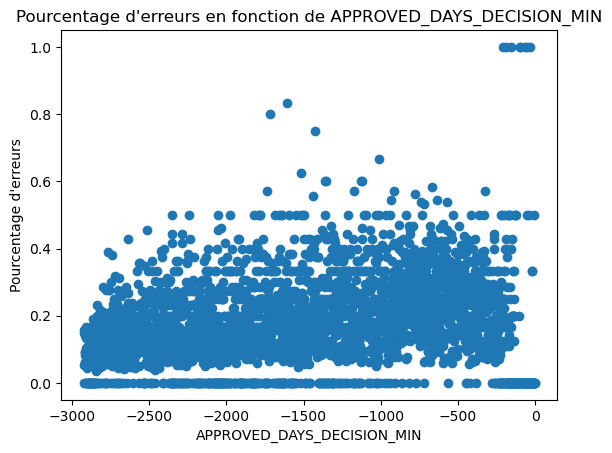

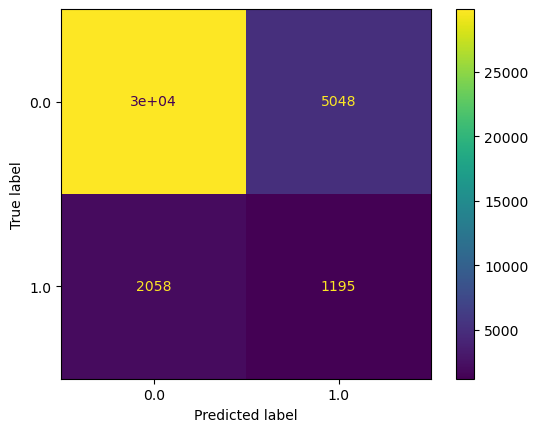

In [69]:
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint

rf_name="Random Forest"
rf = RandomForestClassifier(random_state=42,n_jobs=7)
rf_param_search = {
    'clf__n_estimators': randint(10, 100),
    'clf__max_features': ['sqrt', 'log2'],
    'clf__max_depth': [None] + list(randint(5, 50).rvs(9)),
    'clf__min_samples_split': randint(5, 11),
    'clf__min_samples_leaf': randint(5, 11),
    'clf__bootstrap': [True, False]
}

searchcv_clf_smote_mlflow(rf, rf_name, rf_param_search, X_train_sub, X_test, y_train_sub, y_test, 
                          searchcv = 'random', refit = 'f1', seuil = 0.45)

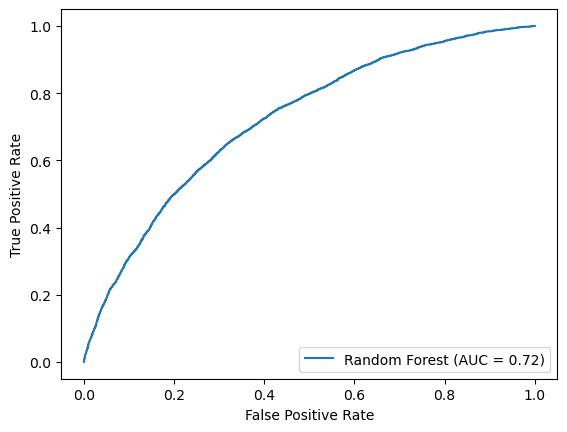

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:54:15 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 29
Created version '29' of model 'projet7_model'.


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scale', StandardScaler()),
                                             ('smote', SMOTE(random_state=42)),
                                             ('clf',
                                              RandomForestClassifier(n_jobs=7,
                                                                     random_state=42))]),
                   n_iter=50, n_jobs=7,
                   param_distributions={'clf__bootstrap': [True, False],
                                        'clf__max_depth': [None, 12, 8, 17, 32,
                                                           42, 23, 43, 21, 11],
                                        'clf__max_features': ['sqrt', 'log2'],
                                        'clf__min_samples_leaf': <...v_discrete_frozen object at 0x2af0e3160>,
                                        'clf__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x2c2b2b040>,
                                        'clf__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x2af1ae730>},
                   refit='fbeta',
                   scoring={'f1': 'f1_macro',
                            'fbeta': make_scorer(fbeta_score, beta=10),
                            'roc_auc': make_scorer(roc_auc_score)})

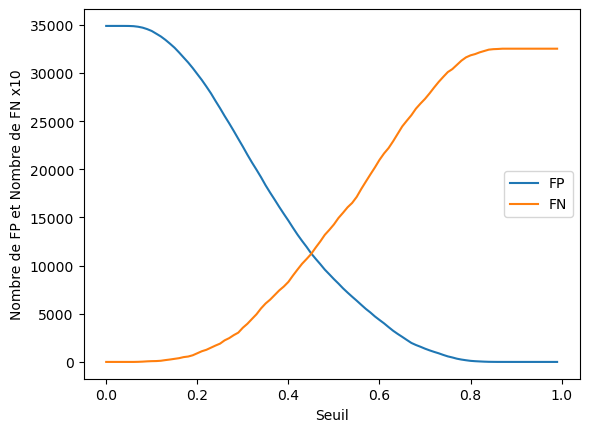

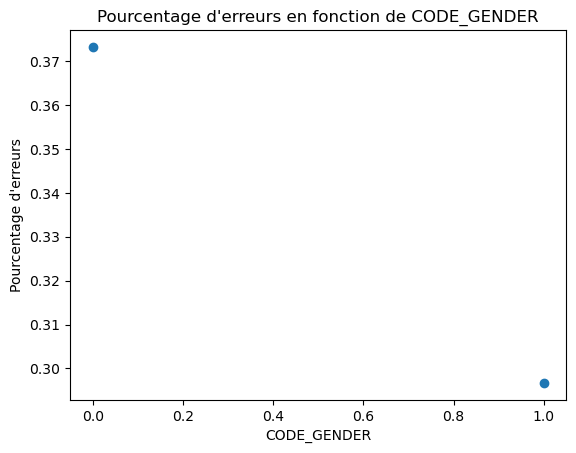

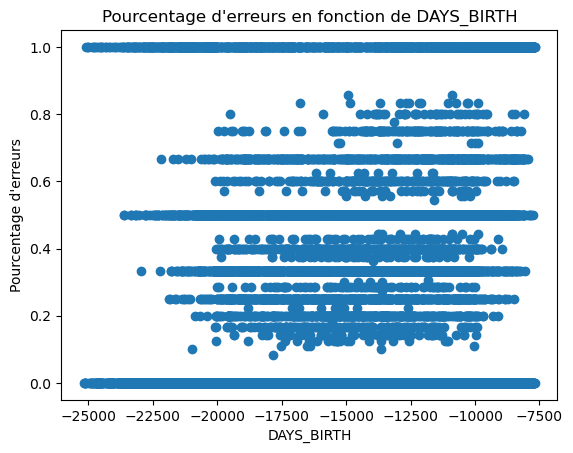

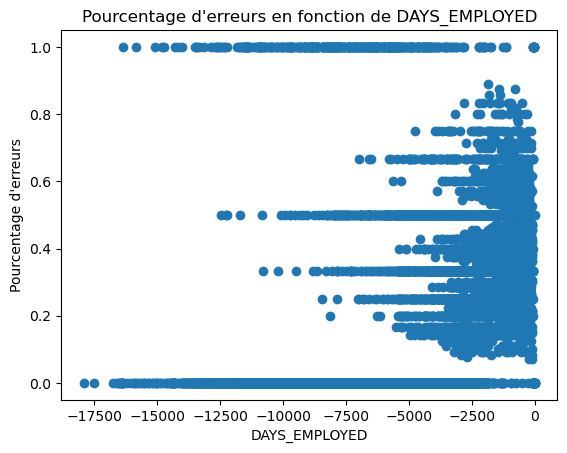

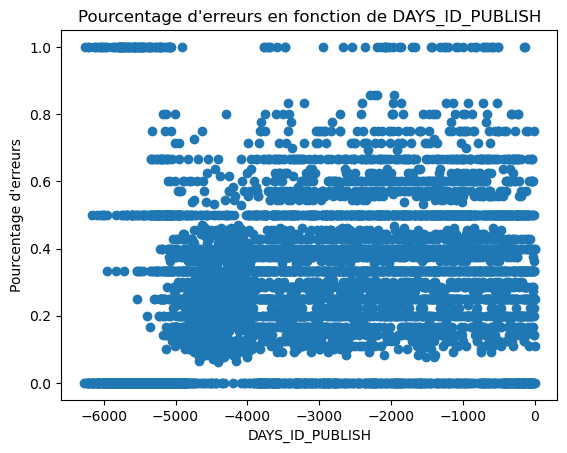

...

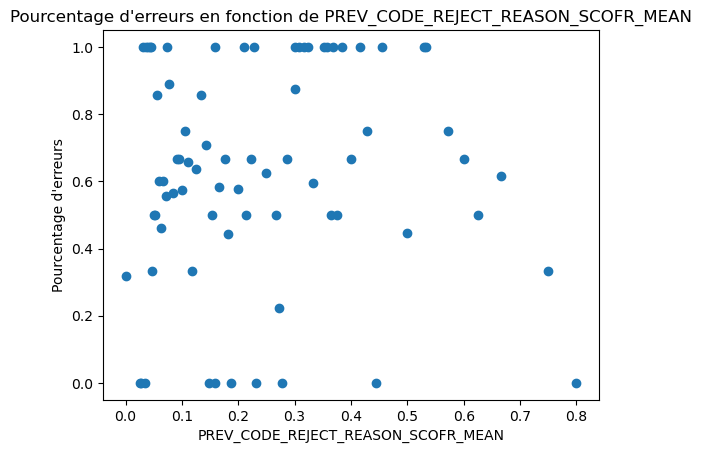

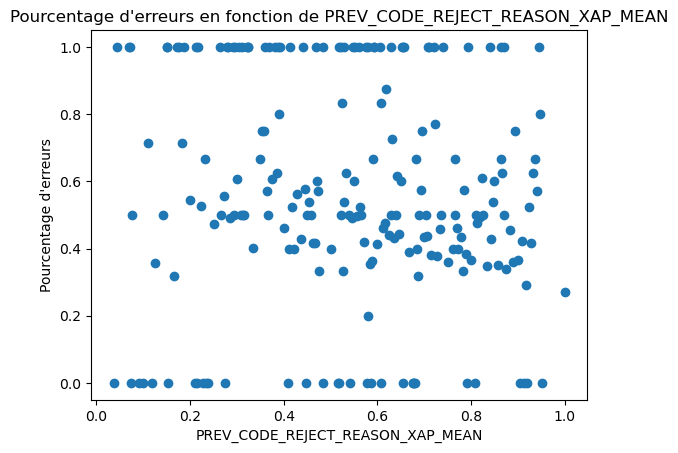

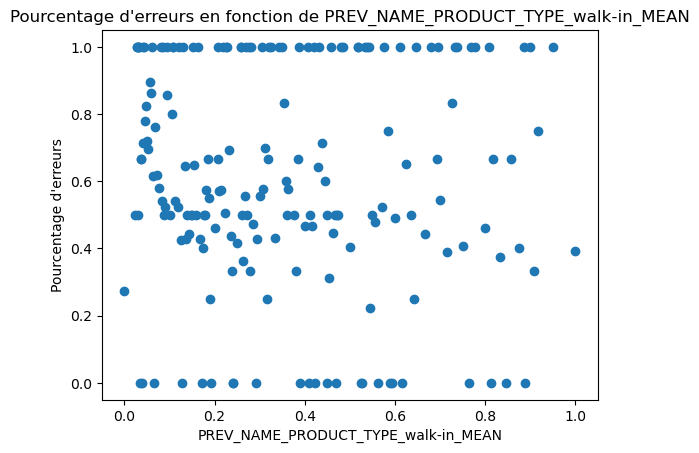

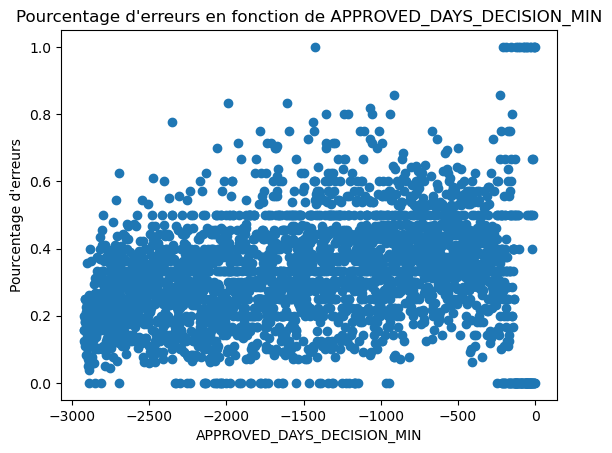

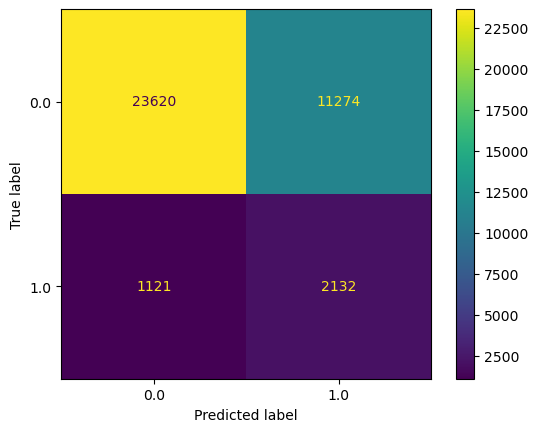

In [70]:
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint

rf_param_search = {
    'clf__n_estimators': randint(10, 100),
    'clf__max_features': ['sqrt', 'log2'],
    'clf__max_depth': [None] + list(randint(5, 50).rvs(9)),
    'clf__min_samples_split': randint(5, 11),
    'clf__min_samples_leaf': randint(5, 11),
    'clf__bootstrap': [True, False]
}

searchcv_clf_smote_mlflow(rf, rf_name, rf_param_search, X_train_sub, X_test, y_train_sub, y_test, 
                          searchcv = 'random', refit = 'fbeta', seuil = 0.45)

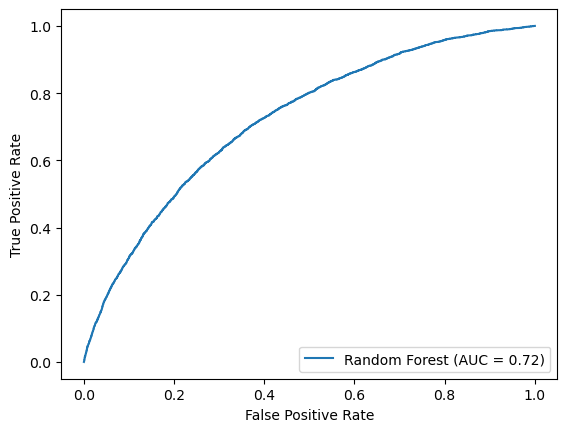

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:58:41 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 30
Created version '30' of model 'projet7_model'.


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scale', StandardScaler()),
                                             ('smote', SMOTE(random_state=42)),
                                             ('clf',
                                              RandomForestClassifier(n_jobs=7,
                                                                     random_state=42))]),
                   n_iter=50, n_jobs=7,
                   param_distributions={'clf__bootstrap': [True, False],
                                        'clf__max_depth': [None, 22, 48, 6, 47,
                                                           30, 13, 14, 17, 36],
                                        'clf__max_features': ['sqrt', 'log2'],
                                        'clf__min_samples_leaf': <...discrete_frozen object at 0x2af4caeb0>,
                                        'clf__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x2d4d17af0>,
                                        'clf__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x2afa62f70>},
                   refit='roc_auc',
                   scoring={'f1': 'f1_macro',
                            'fbeta': make_scorer(fbeta_score, beta=10),
                            'roc_auc': make_scorer(roc_auc_score)})

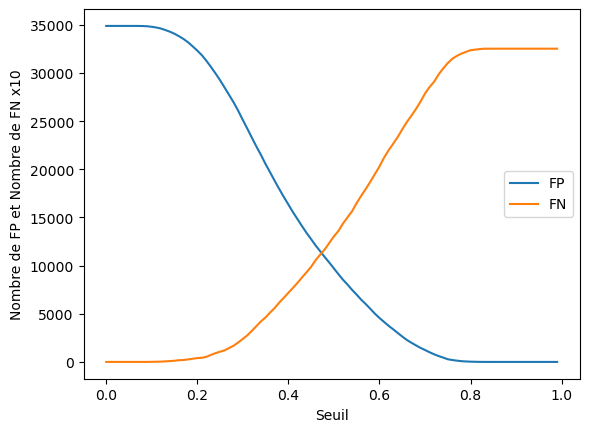

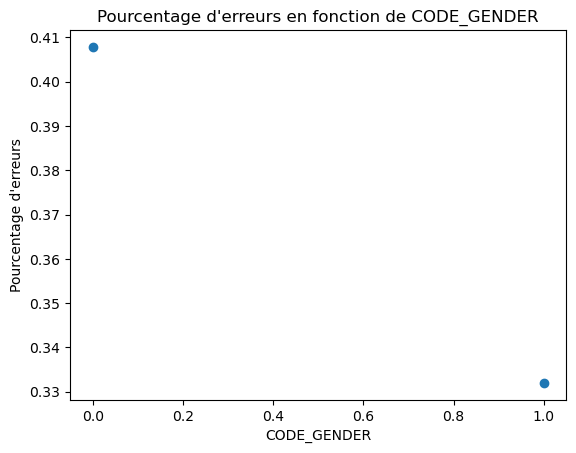

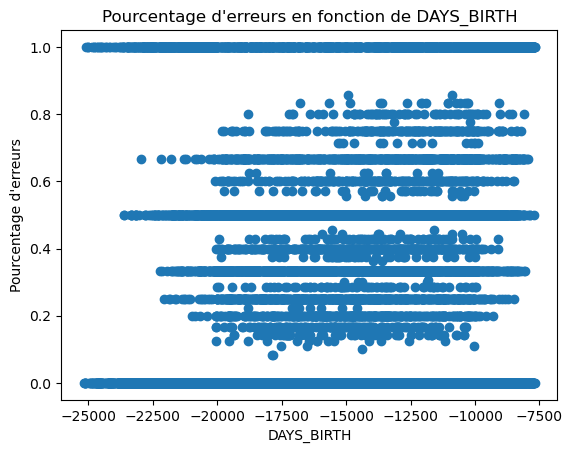

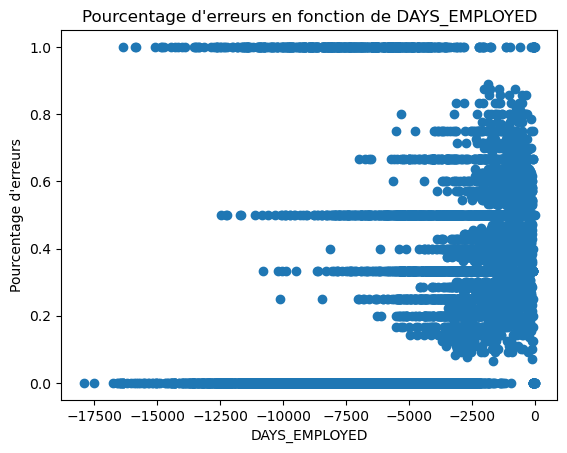

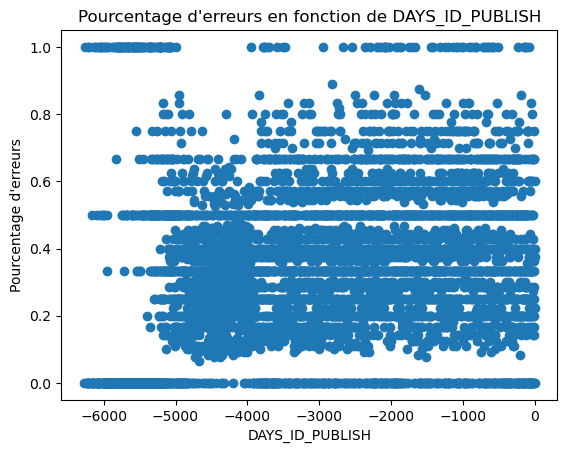

...

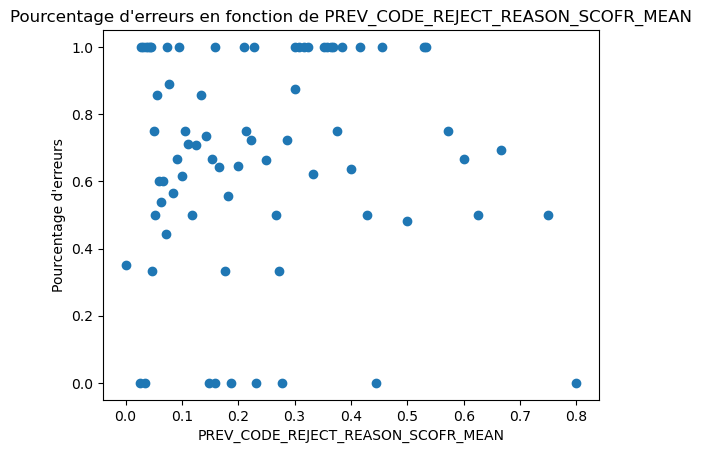

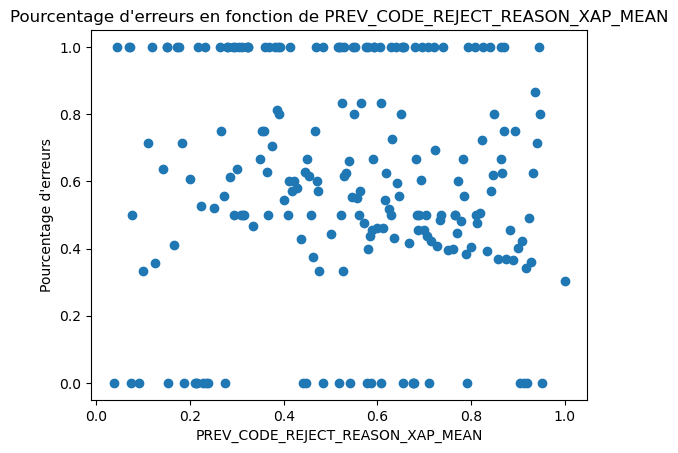

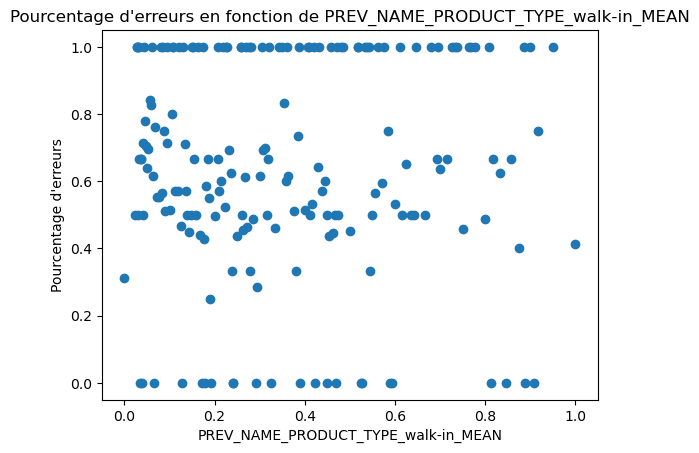

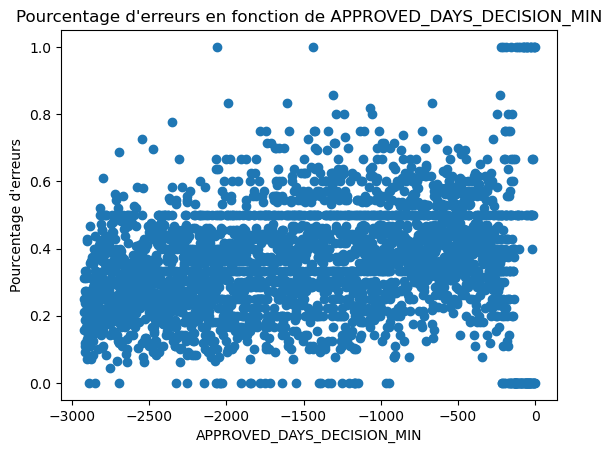

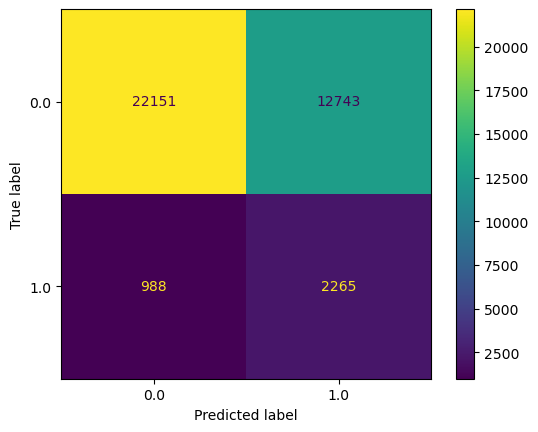

In [71]:
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint

rf_param_search = {
    'clf__n_estimators': randint(10, 100),
    'clf__max_features': ['sqrt', 'log2'],
    'clf__max_depth': [None] + list(randint(5, 50).rvs(9)),
    'clf__min_samples_split': randint(5, 11),
    'clf__min_samples_leaf': randint(5, 11),
    'clf__bootstrap': [True, False]
}

searchcv_clf_smote_mlflow(rf, rf_name, rf_param_search, X_train_sub, X_test, y_train_sub, y_test, 
                          searchcv = 'random', refit = 'roc_auc', seuil = 0.45)

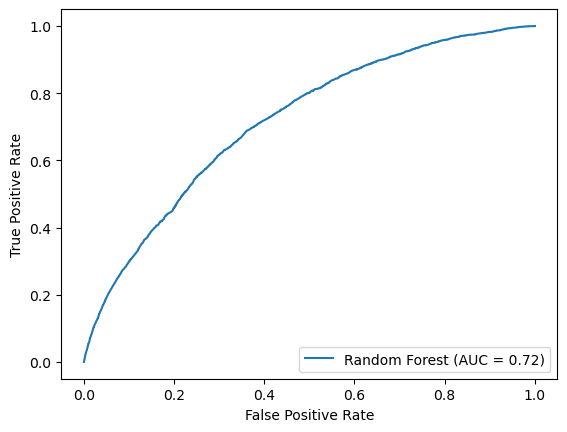

Registered model 'projet7_model' already exists. Creating a new version of this model...
2023/05/26 16:59:46 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: projet7_model, version 31
Created version '31' of model 'projet7_model'.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('smote', SMOTE(random_state=42)),
                                       ('clf',
                                        RandomForestClassifier(n_jobs=7,
                                                               random_state=42))]),
             n_jobs=7,
             param_grid={'clf__criterion': ['gini'], 'clf__max_depth': [4, 5],
                         'clf__max_features': range(9, 10),
                         'clf__min_samples_leaf': [20, 21],
                         'clf__min_samples_split': range(5, 6),
                         'clf__n_estimators': [15, 16]},
             refit='f1',
             scoring={'f1': 'f1_macro',
                      'fbeta': make_scorer(fbeta_score, beta=10),
                      'roc_auc': make_scorer(roc_auc_score)})

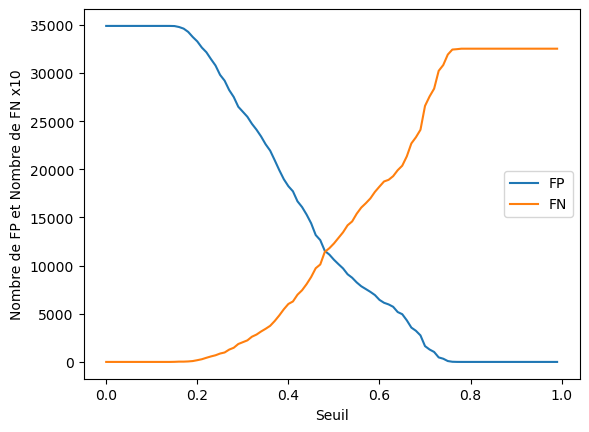

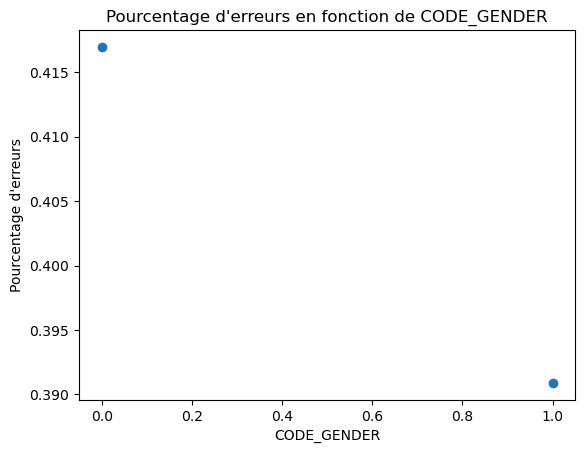

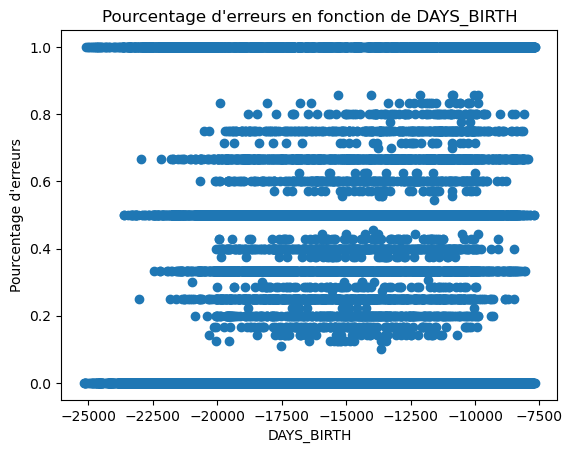

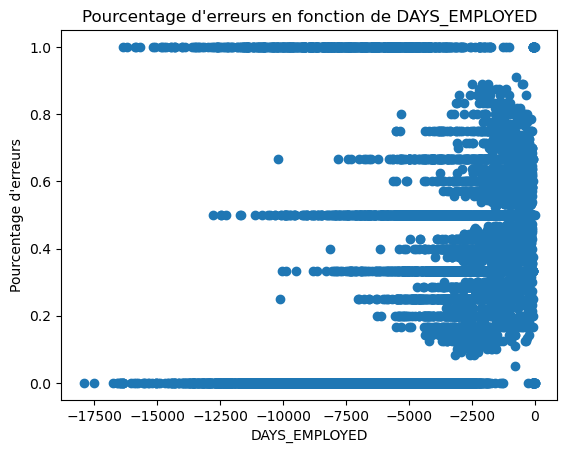

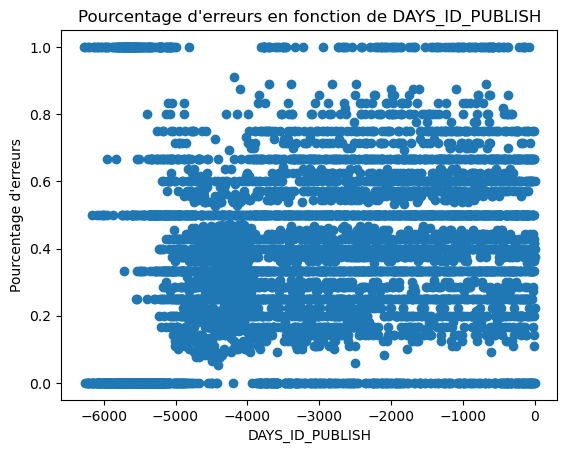

...

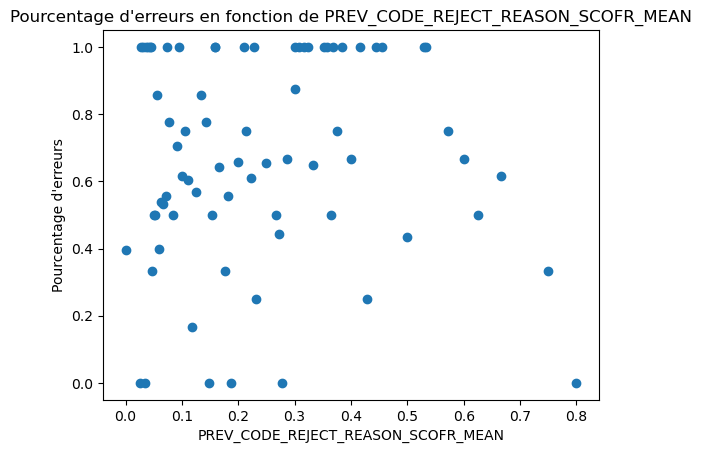

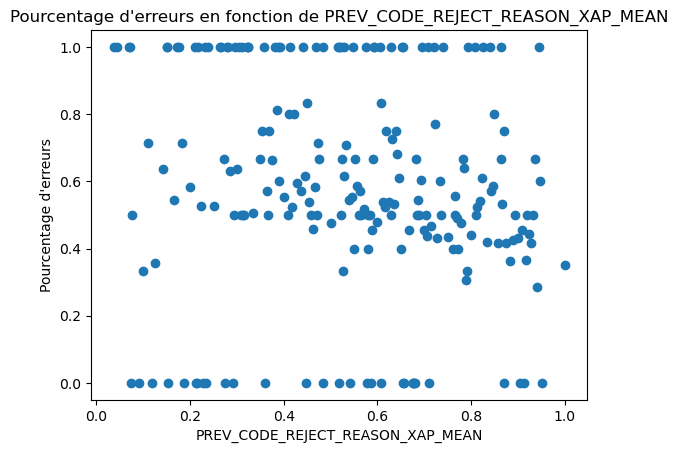

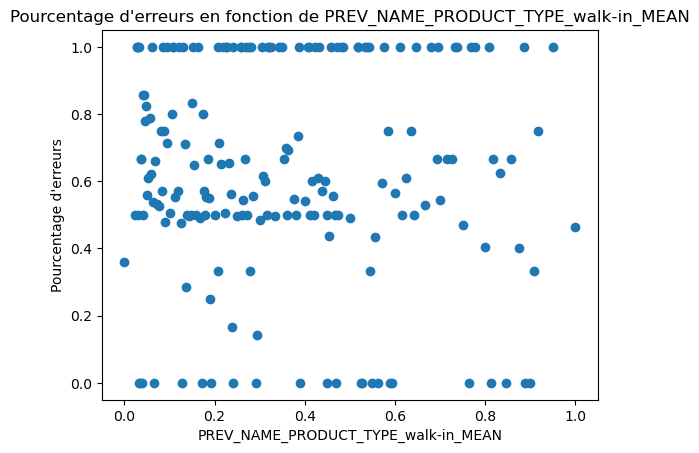

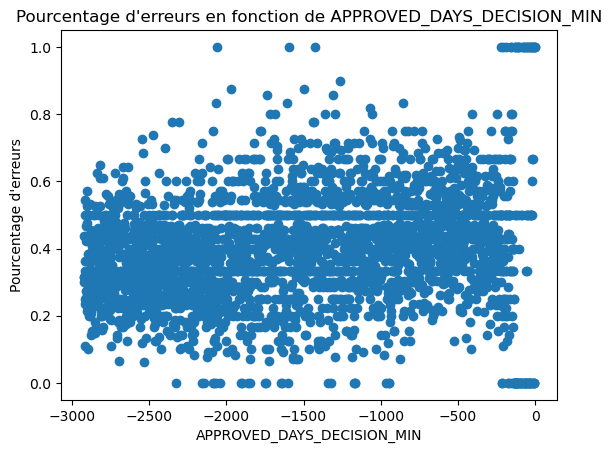

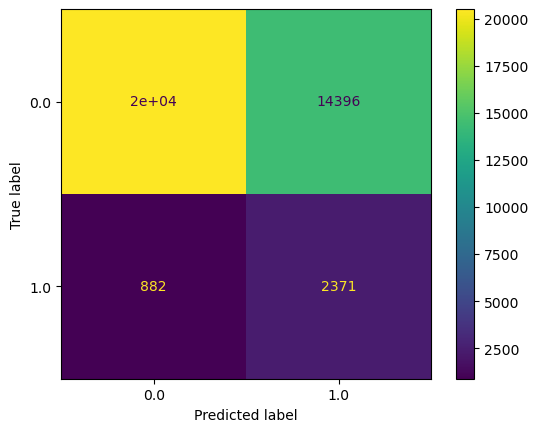

In [72]:
rf_param_search = {"clf__n_estimators":[15, 16],
             "clf__criterion":["gini"],
             "clf__max_depth":[4,5],
             "clf__min_samples_split":range(5,6),
             "clf__min_samples_leaf":[20, 21],
             "clf__max_features": range(9,10)  
}

searchcv_clf_smote_mlflow(rf, rf_name, rf_param_search, X_train, X_test, y_train, y_test, 
                          searchcv = 'grid', refit = 'f1', seuil = 0.45)

In [73]:
rf_param_search = {"clf__n_estimators":[15, 16],
             "clf__criterion":["gini"],
             "clf__max_depth":[4,5],
             "clf__min_samples_split":range(5,6),
             "clf__min_samples_leaf":[20, 21],
             "clf__max_features": range(9,10)  
}

searchcv_clf_smote_mlflow(rf, rf_name, rf_param_search, X_train, X_test, y_train, y_test, 
                          searchcv = 'grid', refit = 'fbeta', seuil = 0.45)

In [74]:
rf_param_search = {"clf__n_estimators":[15, 16],
             "clf__criterion":["gini"],
             "clf__max_depth":[4,5],
             "clf__min_samples_split":range(5,6),
             "clf__min_samples_leaf":[20, 21],
             "clf__max_features": range(9,10)  
}

searchcv_clf_smote_mlflow(rf, rf_name, rf_param_search, X_train, X_test, y_train, y_test, 
                          searchcv = 'grid', refit = 'roc_auc', seuil = 0.45)

In [75]:
mlflow.end_run()

## LGBM Classifier

In [76]:
from lightgbm import LGBMClassifier

lgbm_name="LGBM"
lgbm = LGBMClassifier(random_state=42,n_jobs=7)

In [77]:
lgbm_param_search = {
    'clf__num_leaves': np.linspace(4, 1024, num=5, dtype=int),
    'clf__max_depth': np.linspace(2, 10, num=5, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(100, 10000, num=5, dtype=int)
    #'clf__n_estimators': np.linspace(10, 100, num=5, dtype=int),
    #'clf__learning_rate': np.logspace(-3, -1, num=5),
    #'clf__min_child_samples': np.linspace(5, 30, num=5, dtype=int),
    #'clf__subsample': [0.5, 0.7, 0.9],
    #'clf__colsample_bytree': [0.5, 0.7, 0.9],
    #'clf__reg_alpha': [0, 0.1, 0.5, 1],
    #'clf__reg_lambda': [0, 0.1, 0.5, 1],
    #'clf__min_child_weight': [1e-3, 1e-2, 1e-1, 1, 10]
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train_sub, X_test, y_train_sub, y_test,
                                        searchcv = 'random', refit = 'f1', seuil = 0.45)

In [78]:
lgbm_param_search = {
    'clf__num_leaves': np.linspace(4, 20, num=5, dtype=int),
    'clf__max_depth': np.linspace(2, 5, num=3, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(10000, 1000000, num=5, dtype=int),
    'clf__max_bin': np.linspace(2, 8, num=5, dtype=int),
    'clf__min_data_in_bin' : np.linspace(12, 20, num=5, dtype=int),
    'clf__bagging_fraction' : np.linspace(0.2, 0.8, num=5),
    'clf__bagging_freq' : np.linspace(2, 10, num=5, dtype=int),
    'clf__feature_fraction' : np.linspace(0.6, 0.8, num=5),
    #'clf__n_estimators': np.linspace(10, 100, num=5, dtype=int),
    #'clf__learning_rate': np.logspace(-3, -1, num=5),
    #'clf__min_child_samples': np.linspace(5, 30, num=5, dtype=int),
    #'clf__subsample': [0.5, 0.7, 0.9],
    #'clf__colsample_bytree': [0.5, 0.7, 0.9],
    #'clf__reg_alpha': [0, 0.1, 0.5, 1],
    #'clf__reg_lambda': [0, 0.1, 0.5, 1],
    #'clf__min_child_weight': [1e-3, 1e-2, 1e-1, 1, 10]
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train, X_test, y_train, y_test,
                                        searchcv = 'random', refit = 'f1', seuil = 0.45)

In [79]:
lgbm_param_search = {
    'clf__learning_rate': [0.001],
    'clf__n_estimators': [67],
    'clf__max_depth': [21],
    'clf__num_leaves': [527],
    'clf__min_child_samples': [15],
    'clf__reg_alpha': [0.1],
    'clf__reg_lambda': [0.1],
    'clf__colsample_bytree': [0.5],
    'clf__subsample': [0.9]
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train, X_test, y_train, y_test,
                                        searchcv = 'grid', refit = 'f1', seuil = 0.45)

In [80]:
from lightgbm import LGBMClassifier

lgbm_name="LGBM"
lgbm = LGBMClassifier(random_state=42,n_jobs=7)
lgbm_param_search = {
    'clf__num_leaves': np.linspace(4, 1024, num=20, dtype=int),
    'clf__max_depth': np.linspace(2, 50, num=20, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(100, 100000, num=20, dtype=int)
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train_sub, X_test, y_train_sub, y_test,
                                        searchcv = 'random', refit = 'fbeta', seuil = 0.45)

In [81]:
from lightgbm import LGBMClassifier

lgbm_name="LGBM"
lgbm = LGBMClassifier(random_state=42,n_jobs=7)
lgbm_param_search = {
    'clf__num_leaves': np.linspace(1000, 2000, num=10, dtype=int),
    'clf__max_depth': np.linspace(10, 200, num=5, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(10000, 100000, num=10, dtype=int),
    'clf__max_bin': np.linspace(20, 40, num=5, dtype=int),
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train, X_test, y_train, y_test,
                                        searchcv = 'random', refit = 'fbeta', seuil = 0.45)

In [82]:
lgbm_param_search = {
    'clf__learning_rate': [0.06],
    'clf__n_estimators': [72,73],
    'clf__max_depth': [1,2],
    'clf__num_leaves': [38],
    'clf__min_child_samples': [15],
    'clf__reg_alpha': [0.92],
    'clf__reg_lambda': [0.7],
    'clf__colsample_bytree': [0.74],
    'clf__subsample': [0.8]
}

grid_search = searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search, 
                                        X_train, X_test, y_train, y_test, 
                                        searchcv = 'grid', refit = 'fbeta', seuil = 0.45)

In [83]:
from lightgbm import LGBMClassifier

lgbm_name="LGBM"
lgbm = LGBMClassifier(random_state=42,n_jobs=7)
lgbm_param_search = {
    'clf__num_leaves': np.linspace(4, 1024, num=5, dtype=int),
    'clf__max_depth': np.linspace(2, 10, num=5, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(100, 10000, num=5, dtype=int)
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train, X_test, y_train, y_test,
                                        searchcv = 'random', refit = 'roc_auc', seuil = 0.45)

In [84]:
from lightgbm import LGBMClassifier

lgbm_name="LGBM"
lgbm = LGBMClassifier(random_state=42,n_jobs=7)
lgbm_param_search = {
    'clf__num_leaves': np.linspace(12000, 13500, num=15, dtype=int),
    'clf__max_depth': np.linspace(850, 870, num=15, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(7600, 7700, num=15, dtype=int)
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search,
                                        X_train, X_test, y_train, y_test,
                                        searchcv = 'random', refit = 'roc_auc', seuil = 0.45)

In [85]:
lgbm_param_search = {
    'clf__num_leaves': np.linspace(12000, 13500, num=3, dtype=int),
    'clf__max_depth': np.linspace(850, 870, num=3, dtype=int),
    'clf__min_data_in_leaf' : np.linspace(7600, 7700, num=3, dtype=int)
}

searchcv_clf_smote_mlflow(lgbm, lgbm_name, lgbm_param_search, 
                          X_train, X_test, y_train, y_test, 
                          searchcv = 'grid', refit = 'roc_auc', seuil = 0.45)

In [86]:
# Obtenez le meilleur modèle du GridSearchCV
best_model = grid_search.best_estimator_

# Obtenez le modèle LGBMClassifier du pipeline
clf_model = best_model.named_steps['clf']

# Obtenez les feature importance
importance = clf_model.feature_importances_

# Obtenez les noms de colonnes correspondant aux feature importance
feature_names = best_model.named_steps['scale'].get_feature_names_out()

# Créez un DataFrame pour stocker les feature importance
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importance})

# Triez les features par ordre d'importance décroissant
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False).head(10)

# Tracez la feature importance globale
sns.barplot(x='importance', y='feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [87]:
import lime
import lime.lime_tabular

# initialisation de la méthode LIME pour expliquer les prédictions
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['0', '1'])

# explication de la première observation de test
exp = explainer.explain_instance(X_test.values[0], grid_search.predict_proba)

# affichage du feature importance local pour la première observation de test
exp.show_in_notebook(show_table=True, show_all=False)

In [88]:
X_train.to_csv('X_train.csv',index=False)

## Data Drift

In [89]:
from evidently.metric_preset import DataDriftPreset
from evidently.report import Report

In [90]:
data_drift_report = Report(metrics=[
    DataDriftPreset(),
])

data_drift_report.run(reference_data=X_selection, current_data=test_selection)
data_drift_report.save_html('data_drift_report.html')

## Sauvegarde en pickle

In [91]:
# Sauvegarder le modèle et le seuil dans un fichier pickle
seuil = 0.45
with open('best_model_seuil.pickle', 'wb') as f:
    pickle.dump((best_model, seuil), f)

In [92]:
echantillon = all_selection.loc[all_selection["SK_ID_CURR"]==222222].drop('SK_ID_CURR', axis=1)
echantillon


In [93]:
best_model.predict(
    all_selection.drop('SK_ID_CURR', axis=1).values[0].reshape(1, -1))

probabilites = best_model.predict_proba(echantillon)[:, 1]
predictions = (probabilites > seuil).astype(int)
predictions.shape
